# Study of ads for the sale of apartments

At our disposal is the data of the Yandex.Realty service - an archive of ads for the sale of apartments in St. Petersburg and neighboring settlements for several years. 

Two types of data are available for each apartment for sale. The first ones are entered by the user, the second ones are obtained automatically on the basis of cartographic data. For example, the distance to the center, airport, nearest park and reservoir.

### Read data file, general information

In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import datetime
import numpy as np
import plotly.express as px

In [2]:
# opening data
data = pd.read_csv('/Users/asyl/Desktop/DS/sources/real_estate_data.csv', sep='\t')
pd.set_option('display.max_columns', None)
display(data.head())
data.info()

,total_images,last_price,total_area,first_day_exposition,rooms,ceiling_height,floors_total,living_area,floor,is_apartment,studio,open_plan,kitchen_area,balcony,locality_name,airports_nearest,cityCenters_nearest,parks_around3000,parks_nearest,ponds_around3000,ponds_nearest,days_exposition
0,20,13000000.0,108.0,2019-03-07T00:00:00,3,2.70,16.0,51.0,8,NaN,False,False,25.0,NaN,Санкт-Петербург,18863.0,16028.0,1.0,482.0,2.0,755.0,NaN
1,7,3350000.0,40.4,2018-12-04T00:00:00,1,NaN,11.0,18.6,1,NaN,False,False,11.0,2.0,посёлок Шушары,12817.0,18603.0,0.0,NaN,0.0,NaN,81.0
2,10,5196000.0,56.0,2015-08-20T00:00:00,2,NaN,5.0,34.3,4,NaN,False,False,8.3,0.0,Санкт-Петербург,21741.0,13933.0,1.0,90.0,2.0,574.0,558.0
3,0,64900000.0,159.0,2015-07-24T00:00:00,3,NaN,14.0,NaN,9,NaN,False,False,NaN,0.0,Санкт-Петербург,28098.0,6800.0,2.0,84.0,3.0,234.0,424.0
4,2,10000000.0,100.0,2018-06-19T00:00:00,2,3.03,14.0,32.0,13,NaN,False,False,41.0,NaN,Санкт-Петербург,31856.0,8098.0,2.0,112.0,1.0,48.0,121.0


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 23699 entries, 0 to 23698
Data columns (total 22 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   total_images          23699 non-null  int64  
 1   last_price            23699 non-null  float64
 2   total_area            23699 non-null  float64
 3   first_day_exposition  23699 non-null  object 
 4   rooms                 23699 non-null  int64  
 5   ceiling_height        14504 non-null  float64
 6   floors_total          23613 non-null  float64
 7   living_area           21796 non-null  float64
 8   floor                 23699 non-null  int64  
 9   is_apartment          2775 non-null   object 
 10  studio                23699 non-null  bool   
 11  open_plan             23699 non-null  bool   
 12  kitchen_area          21421 non-null  float64
 13  balcony               12180 non-null  float64
 14  locality_name         23650 non-null  object 
 15  airports_nearest   

**Observations:** The dataset has 23.7k rows and 22 columns. Among the obvious errors, a lot of empty values and an incorrect format of the date column immediately stand out.

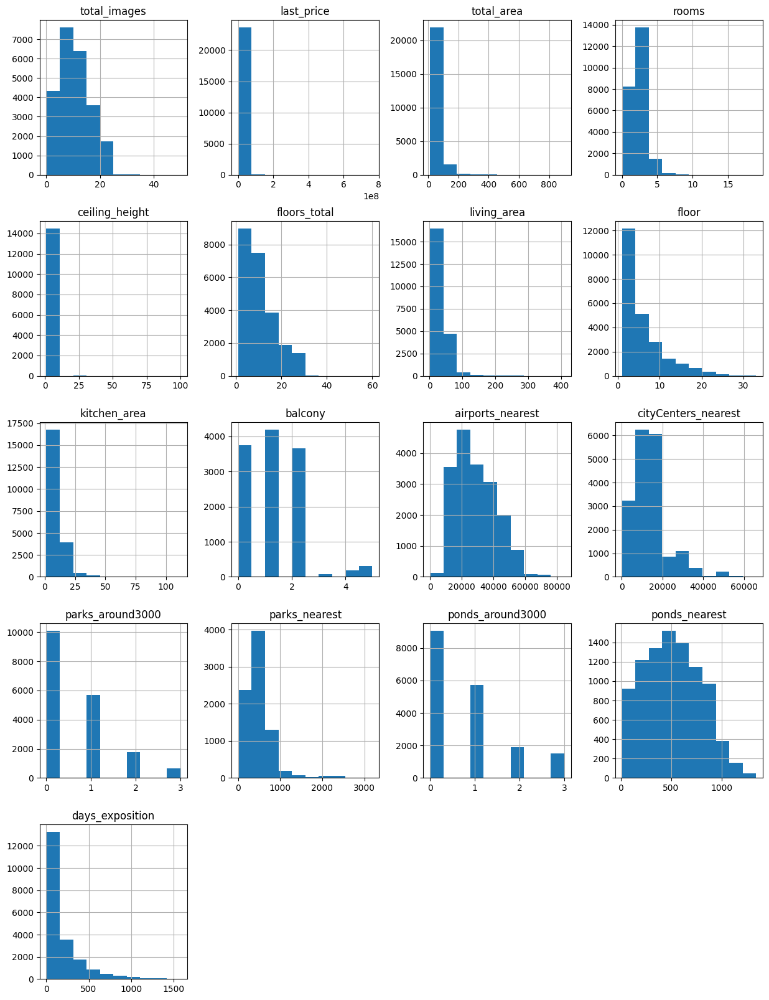

In [3]:
# hists
data.hist(figsize=(15, 20));

### Data preprocessing

Before proceeding with data analysis, we will get rid of missing values and duplicates, convert the data into the correct format, analyze anomalous values and correct errors.

#### Missing values 

total_images                0
last_price                  0
total_area                  0
first_day_exposition        0
rooms                       0
ceiling_height           9195
floors_total               86
living_area              1903
floor                       0
is_apartment            20924
studio                      0
open_plan                   0
kitchen_area             2278
balcony                 11519
locality_name              49
airports_nearest         5542
cityCenters_nearest      5519
parks_around3000         5518
parks_nearest           15620
ponds_around3000         5518
ponds_nearest           14589
days_exposition          3181
dtype: int64


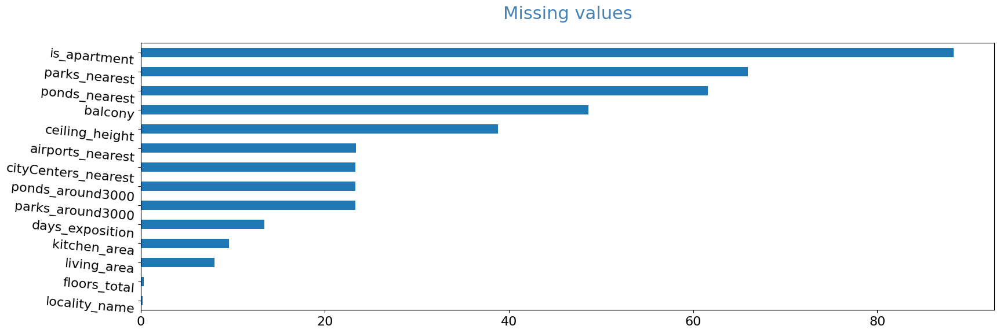

In [4]:
# missing values
print(data.isna().sum())
def pass_value_barh(df):
    try:
        (
            (df.isna().mean()*100)
            .to_frame()
            .rename(columns = {0:'space'})
            .query('space > 0')
            .sort_values(by = 'space', ascending = True)
            .plot(kind= 'barh', figsize=(19,6), rot = -5, legend = False, fontsize = 16)
            .set_title('Missing values' + "\n", fontsize = 22, color = 'SteelBlue')    
        );    
    except:
        print('none left :) ')

pass_value_barh(data)

More than half of the parameters have missing values.

##### Missing values in `ceiling_height` <a id='na_ceiling_height'></a>

Let's look at the first one, `ceiling_height`. Today, the minimum ceiling height in Russia is 2.4 meters. In new buildings, this value is usually in the range of 2.5-2.7 meters. For luxury housing, the figure can exceed 3 meters ([source](https://stone-floor.ru/stati/optimalnaya-visota-potolka#:~:text=%D0%A1%D0%B5%D0%B3%D0%BE%D0%B4%D0%BD%D1%8F%20%D0%BC%D0%B8%D0%BD%D0%B8%D0%BC%D0%B0%D0%BB%D1%8C%D0%BD%D0%BE%D0%B9%20%D0%BD%D0%BE%D1%80%D0%BC%D0%BE%D0%B9%20%D0%B2%20%D0%A0%D0%BE%D1%81%D1%81%D0%B8%D0%B8,%D0%BF%D0%BE%D0%BA%D0%B0%D0%B7%D0%B0%D1%82%D0%B5%D0%BB%D1%8C%20%D0%BC%D0%BE%D0%B6%D0%B5%D1%82%20%D0%BF%D1%80%D0%B5%D0%B2%D1%8B%D1%88%D0%B0%D1%82%D1%8C%203%20%D0%BC%D0%B5%D1%82%D1%80%D0%B0)). 

Ceiling height gaps can be replaced by the median of the entire dataset. To make sure this decision is correct, we list the unique values, then compare the mean and median values.

In [5]:
# ceiling_height
print(data['ceiling_height'].sort_values().unique())
print()
print(data['ceiling_height'].describe())

[  1.     1.2    1.75   2.     2.2    2.25   2.3    2.34   2.4    2.45
   2.46   2.47   2.48   2.49   2.5    2.51   2.52   2.53   2.54   2.55
   2.56   2.57   2.58   2.59   2.6    2.61   2.62   2.63   2.64   2.65
   2.66   2.67   2.68   2.69   2.7    2.71   2.72   2.73   2.74   2.75
   2.76   2.77   2.78   2.79   2.8    2.81   2.82   2.83   2.84   2.85
   2.86   2.87   2.88   2.89   2.9    2.91   2.92   2.93   2.94   2.95
   2.96   2.97   2.98   2.99   3.     3.01   3.02   3.03   3.04   3.05
   3.06   3.07   3.08   3.09   3.1    3.11   3.12   3.13   3.14   3.15
   3.16   3.17   3.18   3.2    3.21   3.22   3.23   3.24   3.25   3.26
   3.27   3.28   3.29   3.3    3.31   3.32   3.33   3.34   3.35   3.36
   3.37   3.38   3.39   3.4    3.42   3.43   3.44   3.45   3.46   3.47
   3.48   3.49   3.5    3.51   3.52   3.53   3.54   3.55   3.56   3.57
   3.58   3.59   3.6    3.62   3.63   3.65   3.66   3.67   3.68   3.69
   3.7    3.75   3.76   3.78   3.8    3.82   3.83   3.84   3.85   3.86
   3.8

It is difficult to imagine apartments with a height of less than 2 meters, although it can be assumed that these are attics or basements. On the other hand, anomalously high values are also presented in the dataset. In this case, we presume a data entry error, for example, instead of 2 m., 20 m is written, etc.

The `describe()` function showed an interquartile range of 2.52 to 2.8 meters.

To correct empty values ​​in this column, it is proposed to replace them with the median value. To do this, we first need to deal with rare anomalous values:
 - suppose that in values ​​where the height is more than 10 m, the input of real and essential values ​​is mixed up. Let's divide these values ​​by 10.
 - in lines where the ceiling height is more than 100, we assume that the height is indicated in centimeters. We convert them to meters.
 - other values ​​(up to 10 m) are left as is, because the nature of possible errors is not known.
 - also, for uniformity of the format, we will round the values ​​to the rank of one tenth.

In [6]:
# anomalies
def sort_ceiling_height(height):
    if (height >= 11):
        height = height / 10
    if (height >= 11): 
        height = height / 10
    return round(height, 1)

data['ceiling_height'] = data['ceiling_height'].apply(sort_ceiling_height)
data['ceiling_height'].fillna(data['ceiling_height'].median(), inplace=True)

# check
print('Median after processing: \t \t', data['ceiling_height'].median())
print('Missing values after processing: \t', data['ceiling_height'].isna().sum())

Median after processing: 	 	 2.6
Missing values after processing: 	 0


##### Missing values in `floors_total`

There are not many missing values in the `floors_total` column, and none at all in the `floor` column. Probably, these data were not entered for one-story buildings. Let's check the assumption by displaying the lines that do not indicate the total number of storeys of the building.

In [7]:
# show missing
display(data[data['floors_total'].isna()].head())

,total_images,last_price,total_area,first_day_exposition,rooms,ceiling_height,floors_total,living_area,floor,is_apartment,studio,open_plan,kitchen_area,balcony,locality_name,airports_nearest,cityCenters_nearest,parks_around3000,parks_nearest,ponds_around3000,ponds_nearest,days_exposition
186,12,11640000.0,65.2,2018-10-02T00:00:00,2,2.6,NaN,30.80,4,NaN,False,False,12.00,NaN,Санкт-Петербург,39197.0,12373.0,1.0,123.0,0.0,NaN,49.0
237,4,2438033.0,28.1,2016-11-23T00:00:00,1,2.6,NaN,20.75,1,NaN,False,False,NaN,0.0,Санкт-Петербург,22041.0,17369.0,0.0,NaN,1.0,374.0,251.0
457,4,9788348.0,70.8,2015-08-01T00:00:00,2,2.6,NaN,38.40,12,NaN,False,False,10.63,0.0,Санкт-Петербург,37364.0,8322.0,2.0,309.0,2.0,706.0,727.0
671,4,6051191.0,93.6,2017-04-06T00:00:00,3,2.6,NaN,47.10,8,NaN,False,False,16.80,0.0,Санкт-Петербург,22041.0,17369.0,0.0,NaN,1.0,374.0,123.0
1757,5,3600000.0,39.0,2017-04-22T00:00:00,1,2.6,NaN,NaN,9,NaN,False,False,NaN,0.0,Санкт-Петербург,22735.0,11618.0,1.0,835.0,1.0,652.0,77.0


Our initial guess is ruled out, the `floor` column contains different values ​​above 1.

General histograms showed the predominance of low- and medium-rise buildings. This means that replacing missing values with medians here will be an incorrect decision, because it may turn out that the floor of the apartment will be higher than the total number of storeys of the building. In this regard, let's assign the missing values in the `floors_total` column to the values ​​of the `floor` column. Looking ahead, we will add 1 floor to the new values ​​of `floors_total` so as not to subsequently affect the type of floor (`first`, `last`, `other`). At the same time, we will check whether there are errors of this kind in the dataset.

In [8]:
# filling missing values floors_total
data['floors_total'] = data['floors_total'].fillna(data['floor'] + 1).astype(int)

# check for errors
print('Missing values: \t \t', data['floors_total'].isna().sum())
print('Errrors: \t', 
      len(data[data['floors_total'] < data['floor']]))

Missing values: 	 	 0
Errrors: 	 0


##### Missing values in `living_area` and `kitchen_area`
The most important parameter `total_area` has no missing values, unlike living area and kitchen area. Studio apartments by their type do not have a separate kitchen area. Let's test this theory.

In [9]:
# check
display(data.query('studio and kitchen_area > 0').head())
display(data.query('studio and kitchen_area.isna()').head())

,total_images,last_price,total_area,first_day_exposition,rooms,ceiling_height,floors_total,living_area,floor,is_apartment,studio,open_plan,kitchen_area,balcony,locality_name,airports_nearest,cityCenters_nearest,parks_around3000,parks_nearest,ponds_around3000,ponds_nearest,days_exposition


,total_images,last_price,total_area,first_day_exposition,rooms,ceiling_height,floors_total,living_area,floor,is_apartment,studio,open_plan,kitchen_area,balcony,locality_name,airports_nearest,cityCenters_nearest,parks_around3000,parks_nearest,ponds_around3000,ponds_nearest,days_exposition
144,1,2450000.0,27.00,2017-03-30T00:00:00,0,2.6,24,15.50,2,NaN,True,False,NaN,2.0,посёлок Мурино,NaN,NaN,NaN,NaN,NaN,NaN,181.0
440,8,2480000.0,27.11,2018-03-12T00:00:00,0,2.6,17,24.75,4,NaN,True,False,NaN,2.0,Санкт-Петербург,38171.0,15015.0,0.0,NaN,2.0,982.0,64.0
608,2,1850000.0,25.00,2019-02-20T00:00:00,0,2.6,10,NaN,7,NaN,True,False,NaN,NaN,посёлок Шушары,NaN,NaN,NaN,NaN,NaN,NaN,29.0
697,12,2500000.0,24.10,2017-12-01T00:00:00,0,2.8,25,17.50,21,NaN,True,False,NaN,NaN,деревня Кудрово,NaN,NaN,NaN,NaN,NaN,NaN,201.0
716,5,1500000.0,17.00,2017-06-07T00:00:00,0,2.7,9,12.00,1,NaN,True,False,NaN,0.0,посёлок Шушары,18654.0,29846.0,0.0,NaN,0.0,NaN,40.0


We replace all missing values in the kitchen area of studio apartments with `0`.

In [10]:
data.loc[data['studio'] == True, 'kitchen_area'] = 0
print('Missing values after processing: \t', data['kitchen_area'].isna().sum())

Missing values after processing: 	 2129


Guessing the nature of other missing values and calculating the values for the `living_area` and `kitchen-area` columns is rather problematic, so we fill in the gaps with the values `-1`. In the future, in the analysis it will be possible to exclude these values.

In [11]:
# replacing missing values with -1
data.fillna({'living_area' : -1, 'kitchen_area' : -1}, inplace=True)

##### Missing values in `is_apartment`
According to the database description, the columns `is_apartment`, `studio` and `open_plan` must store a boolean data type. There are missing values only in the first one, we will display their number.

In [12]:
print(data['is_apartment'].value_counts(dropna=False))

NaN      20924
False     2725
True        50
Name: is_apartment, dtype: int64


Nearly 90% of apartments are missing the `is_apartment` value. It is logical to assume that in the advertisements for the sale of apartments, the vast majority of lots will be represented by apartments. Replace gaps with `True`.

In [13]:
# replacing missing values with True
data['is_apartment'].fillna(True, inplace=True)
# check type is_apartment
data['is_apartment'].dtype

dtype('bool')

##### Missing values `balcony`
This column shows the number of balconies per apartment. Let's display the number of unique values and look at apartments that do not have a number of balconies.

In [14]:
print(data['balcony'].value_counts(dropna=False))
display(data.query('balcony.isna()'))

NaN    11519
1.0     4195
0.0     3758
2.0     3659
5.0      304
4.0      183
3.0       81
Name: balcony, dtype: int64


,total_images,last_price,total_area,first_day_exposition,rooms,ceiling_height,floors_total,living_area,floor,is_apartment,studio,open_plan,kitchen_area,balcony,locality_name,airports_nearest,cityCenters_nearest,parks_around3000,parks_nearest,ponds_around3000,ponds_nearest,days_exposition
0,20,13000000.0,108.00,2019-03-07T00:00:00,3,2.7,16,51.00,8,True,False,False,25.00,NaN,Санкт-Петербург,18863.0,16028.0,1.0,482.0,2.0,755.0,NaN
4,2,10000000.0,100.00,2018-06-19T00:00:00,2,3.0,14,32.00,13,True,False,False,41.00,NaN,Санкт-Петербург,31856.0,8098.0,2.0,112.0,1.0,48.0,121.0
5,10,2890000.0,30.40,2018-09-10T00:00:00,1,2.6,12,14.40,5,True,False,False,9.10,NaN,городской посёлок Янино-1,NaN,NaN,NaN,NaN,NaN,NaN,55.0
8,20,2900000.0,33.16,2018-05-23T00:00:00,1,2.6,27,15.43,26,True,False,False,8.81,NaN,посёлок Мурино,NaN,NaN,NaN,NaN,NaN,NaN,189.0
10,5,5050000.0,39.60,2017-11-16T00:00:00,1,2.7,12,20.30,3,True,False,False,8.50,NaN,Санкт-Петербург,38357.0,13878.0,1.0,310.0,2.0,553.0,137.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
23692,2,1350000.0,30.00,2017-07-07T00:00:00,1,2.6,5,17.50,4,True,False,False,6.00,NaN,Тихвин,NaN,NaN,NaN,NaN,NaN,NaN,413.0
23694,9,9700000.0,133.81,2017-03-21T00:00:00,3,3.7,5,73.30,3,True,False,False,13.83,NaN,Санкт-Петербург,24665.0,4232.0,1.0,796.0,3.0,381.0,NaN
23695,14,3100000.0,59.00,2018-01-15T00:00:00,3,2.6,5,38.00,4,True,False,False,8.50,NaN,Тосно,NaN,NaN,NaN,NaN,NaN,NaN,45.0
23696,18,2500000.0,56.70,2018-02-11T00:00:00,2,2.6,3,29.70,1,True,False,False,-1.00,NaN,село Рождествено,NaN,NaN,NaN,NaN,NaN,NaN,NaN


Half of all ads do not indicate the number of balconies. The reason for the omissions may be the lack of balconies, but it is unlikely that more than half of the apartments do not have balconies, especially since there are many spacious apartments with a large number of rooms among them. Since the reason for the omission is not known, we cannot change everything to `0`, so we will replace the missing values with `-1` so as not to distort the subsequent analysis.

In [15]:
# changing missing values with -1 and changing type to int
data['balcony'] = data['balcony'].fillna(-1).astype(int)
# check
print(data['balcony'].value_counts(dropna=False))

-1    11519
 1     4195
 0     3758
 2     3659
 5      304
 4      183
 3       81
Name: balcony, dtype: int64


##### Missing values in `locality_name`
There are very few missing values in `locality_name`. Instead of gaps, we write down `n/d` (not defined).

In [16]:
# меняем пропуски на n/d
data['locality_name'].fillna('n/d', inplace=True)
# проверка
print('Количество пропусков в столбце locality_name после обработки: \t', data['locality_name'].isna().sum())

Количество пропусков в столбце locality_name после обработки: 	 0


##### Missing values in `airports_nearest` and `cityCenters_nearest`

It is noteworthy that the number of missing values in both columns is approximately equal to each other. We will find out the exact number of lines that do not contain information about the location relative to the airport and the city center at the same time.

In [17]:
# сount the missing values
print(len(data[(data['airports_nearest'].isna()) & (data['cityCenters_nearest'].isna())]))

5518


Exactly as much as in the `parks_around3000` and `ponds_around3000` columns. Let's also check their relationship with the `parks_nearest` and `ponds_nearest` columns.

In [18]:
# count all the missing values in location columns
print(len(data[(data['airports_nearest'].isna()) & 
               (data['cityCenters_nearest'].isna()) & 
               (data['parks_around3000'].isna()) & 
               (data['ponds_around3000'].isna()) & 
               (data['parks_nearest'].isna()) & 
               (data['ponds_nearest'].isna())]))

5518


It turns out that almost a quarter of all data does not have information about the location, not counting the name of the settlement. As in the previous cases, to simplify data filtering, we will assign the values `-1` to missing values. First we need to check if there are negative values in the original dataset.

In [19]:
# we assign -1 only in case there were not any before
data[['cityCenters_nearest', 'airports_nearest', 'parks_around3000', 
      'ponds_around3000', 'parks_nearest', 'ponds_nearest']].min()

cityCenters_nearest    181.0
airports_nearest         0.0
parks_around3000         0.0
ponds_around3000         0.0
parks_nearest            1.0
ponds_nearest           13.0
dtype: float64

The check revealed a `0` value in the distance to the nearest airport parameter. It is unlikely that anyone is allowed to live on the territory of the airport, let's check the type of property located at the airport.

In [20]:
display(data[data['airports_nearest'] < 1000])

,total_images,last_price,total_area,first_day_exposition,rooms,ceiling_height,floors_total,living_area,floor,is_apartment,studio,open_plan,kitchen_area,balcony,locality_name,airports_nearest,cityCenters_nearest,parks_around3000,parks_nearest,ponds_around3000,ponds_nearest,days_exposition
21085,0,7000000.0,34.7,2018-09-23T00:00:00,1,2.7,9,19.8,3,True,False,False,6.0,2,Санкт-Петербург,0.0,22801.0,0.0,NaN,0.0,NaN,60.0


Surely there is a mistake, and the distance to the airport is not known.

In [21]:
# filling missing values with -1
data[data['ponds_around3000'].isna()] = (data[data['ponds_around3000'].isna()]
                                         .fillna({'cityCenters_nearest' : -1, 'airports_nearest' : -1,
                                                  'parks_around3000' : -1, 'ponds_around3000' : -1,
                                                  'parks_nearest' : -1, 'ponds_nearest' : -1}))
data.loc[data['airports_nearest'] < 1000, 'airports_nearest'] = -1
# check
print('Missing values in cityCenters_nearest: \t', data['cityCenters_nearest'].isna().sum())
print('Missing values in airports_nearest: \t', data['airports_nearest'].isna().sum())

Missing values in cityCenters_nearest: 	 1
Missing values in airports_nearest: 	 24


The remaining few missing values in `airports_nearest` and `cityCenters_nearest` are not related to each other, we will also assign the values `-1` for them.

In [22]:
# filling missings with -1
data = data.fillna({'cityCenters_nearest' : -1, 'airports_nearest' : -1})

##### Missing values in `parks_around3000`, `parks_nearest`, `ponds_around3000` and `ponds_nearest`
Previously, we found out that 5518 ads did not have data on the distance from other objects. So, all the gaps in the `parks_around3000` and `ponds_around3000` columns and some of the gaps in `parks_nearest` and `ponds_nearest` have already been processed in the previous step, they were given the values `-1`.

We will check the remaining passes for the presence of parks or water bodies within a radius of up to 3 km.

In [23]:
# check
display(data[(data['parks_around3000'] > 0) & data['parks_nearest'].isna()])
display(data[(data['ponds_around3000'] > 0) & data['ponds_nearest'].isna()])

,total_images,last_price,total_area,first_day_exposition,rooms,ceiling_height,floors_total,living_area,floor,is_apartment,studio,open_plan,kitchen_area,balcony,locality_name,airports_nearest,cityCenters_nearest,parks_around3000,parks_nearest,ponds_around3000,ponds_nearest,days_exposition


,total_images,last_price,total_area,first_day_exposition,rooms,ceiling_height,floors_total,living_area,floor,is_apartment,studio,open_plan,kitchen_area,balcony,locality_name,airports_nearest,cityCenters_nearest,parks_around3000,parks_nearest,ponds_around3000,ponds_nearest,days_exposition


It turns out that if there are no parks or reservoirs within a radius of up to 3 km from the apartment, then the distance is not indicated in the corresponding columns `parks_nearest` and `ponds_nearest`. Since we have already used `-1` here for objects that do not have any location distance data, for missing distances greater than 3 km, we will put down another category of values - `-2`.

In [24]:
# fillings the missing values with -2 for apartment that doesn't have parks or ponds nearby
data = data.fillna({'parks_nearest' : -2, 'ponds_nearest' : -2})
print('Количество пропусков в столбце parks_nearest после обработки: \t \t', data['parks_nearest'].isna().sum())
print('Количество пропусков в столбце parks_around3000 после обработки: \t', data['parks_around3000'].isna().sum())
print('Количество пропусков в столбце ponds_nearest после обработки: \t \t', data['ponds_nearest'].isna().sum())
print('Количество пропусков в столбце ponds_around3000 после обработки: \t', data['ponds_around3000'].isna().sum())

Количество пропусков в столбце parks_nearest после обработки: 	 	 0
Количество пропусков в столбце parks_around3000 после обработки: 	 0
Количество пропусков в столбце ponds_nearest после обработки: 	 	 0
Количество пропусков в столбце ponds_around3000 после обработки: 	 0


##### Missing values in `days_exposition`


Omissions of `days_exposition` are related to the publication date of the ad. Perhaps the omissions mean that the ad was never removed from publication. In this case, let's create a new category `sale_failed` for passes and save the status of the announcement in it.

Let us calculate the values of missing values by the following method.
- change the dates into the appropriate format.
- Calculate the latest date of removal of the publication of the announcement.
- Calculate the publication period of ads for the missing values at the time of the last removal of the publication.

In [25]:
# creating new category sale_failed
data['sale_failed'] = data['days_exposition'].isna()
# check the minimal days_exposition
data['days_exposition'].min()

1.0

Ads hung for at least 1 day, so for the missing values we can temporarily assign the value `0` to perform the necessary calculations.

In [26]:
# changing the format
data['first_day_exposition'] = pd.to_datetime(data['first_day_exposition'], format='%Y-%m-%d')
# calculating the latest date, for missing values temporarily assigning 0
data['days_exposition'] = data['days_exposition'].fillna(0).astype(int)
data['last_day_exposition'] = data['first_day_exposition'] + pd.to_timedelta(data['days_exposition'], 'd')
last_day = data['last_day_exposition'].max()
print('The latest date:', last_day)

The latest date: 2019-05-03 00:00:00


,total_images,last_price,total_area,first_day_exposition,rooms,ceiling_height,floors_total,living_area,floor,is_apartment,studio,open_plan,kitchen_area,balcony,locality_name,airports_nearest,cityCenters_nearest,parks_around3000,parks_nearest,ponds_around3000,ponds_nearest,days_exposition,sale_failed,last_day_exposition
0,20,13000000.0,108.0,2019-03-07,3,2.7,16,51.0,8,True,False,False,25.0,-1,Санкт-Петербург,18863.0,16028.0,1.0,482.0,2.0,755.0,57,True,2019-05-03
1,7,3350000.0,40.4,2018-12-04,1,2.6,11,18.6,1,True,False,False,11.0,2,посёлок Шушары,12817.0,18603.0,0.0,-2.0,0.0,-2.0,81,False,2019-02-23
2,10,5196000.0,56.0,2015-08-20,2,2.6,5,34.3,4,True,False,False,8.3,0,Санкт-Петербург,21741.0,13933.0,1.0,90.0,2.0,574.0,558,False,2017-02-28
3,0,64900000.0,159.0,2015-07-24,3,2.6,14,-1.0,9,True,False,False,-1.0,0,Санкт-Петербург,28098.0,6800.0,2.0,84.0,3.0,234.0,424,False,2016-09-20
4,2,10000000.0,100.0,2018-06-19,2,3.0,14,32.0,13,True,False,False,41.0,-1,Санкт-Петербург,31856.0,8098.0,2.0,112.0,1.0,48.0,121,False,2018-10-18


none left :) 


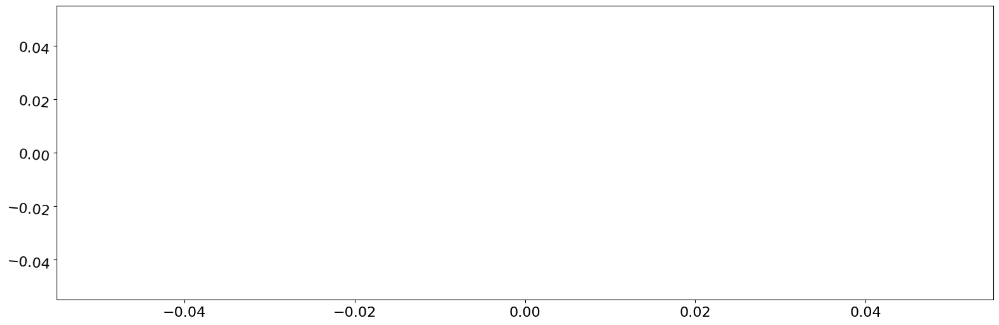

In [27]:
# we calculate the publication period of ads for missing values at the time of the last removal of the ad
data['days_exposition'].where(data['days_exposition'] != 0, 
                              (last_day - data['first_day_exposition']).dt.days, 
                              inplace=True)
# update the last_day_exposition column with filled gaps
data['last_day_exposition'] = data['first_day_exposition'] + pd.to_timedelta(data['days_exposition'], 'd')
# check the resulting table
display(data.head())
# final pass check
pass_value_barh(data)

#### Data types

Let's derive the types of all data.

In [75]:
data.dtypes

total_images                     int64
last_price                       int64
total_area                     float64
first_day_exposition    datetime64[ns]
rooms                            int64
ceiling_height                 float64
floors_total                     int64
living_area                    float64
floor                            int64
is_apartment                      bool
studio                            bool
open_plan                         bool
kitchen_area                   float64
balcony                          int64
locality_name                   object
airports_nearest                 int64
cityCenters_nearest              int64
parks_around3000                 int64
parks_nearest                    int64
ponds_around3000                 int64
ponds_nearest                    int64
days_exposition                  int64
sale_failed                       bool
last_day_exposition     datetime64[ns]
locality_type                   object
dtype: object

We have already changed the formats of some of the columns during the missing values handling. The `first_day_exposition` column has been converted to date format, `ceiling_height` values have been rounded to the nearest tenth place, and `is_apartment` is now a boolean data type.

The remaining types, except for areas, will be translated into new data type for easier perception.

In [76]:
# convert certain columns to essential data type
columns = ['last_price', 'airports_nearest', 'cityCenters_nearest', 'parks_around3000', 
           'parks_nearest', 'ponds_around3000', 'ponds_nearest', 'days_exposition']
for col in columns:
    data[col] = data[col].astype(int)

#### Duplicates

In [77]:
# check for duplicates
data.duplicated().sum()

0

##### Duplicates of `locality_name`
The dataset has no explicit duplicates, implicit ones can only be contained in one column with the `object` type - this is `locality_name`.

In [31]:
# output a list of unique locality_name values
data['locality_name'].sort_values().unique()

array(['n/d', 'Бокситогорск', 'Волосово', 'Волхов', 'Всеволожск',
       'Выборг', 'Высоцк', 'Гатчина', 'Зеленогорск', 'Ивангород',
       'Каменногорск', 'Кингисепп', 'Кириши', 'Кировск', 'Колпино',
       'Коммунар', 'Красное Село', 'Кронштадт', 'Кудрово',
       'Лодейное Поле', 'Ломоносов', 'Луга', 'Любань', 'Мурино',
       'Никольское', 'Новая Ладога', 'Отрадное', 'Павловск', 'Петергоф',
       'Пикалёво', 'Подпорожье', 'Приморск', 'Приозерск', 'Пушкин',
       'Санкт-Петербург', 'Светогорск', 'Сертолово', 'Сестрорецк',
       'Сланцы', 'Сосновый Бор', 'Сясьстрой', 'Тихвин', 'Тосно',
       'Шлиссельбург', 'городской поселок Большая Ижора',
       'городской поселок Янино-1', 'городской посёлок Будогощь',
       'городской посёлок Виллози', 'городской посёлок Лесогорский',
       'городской посёлок Мга', 'городской посёлок Назия',
       'городской посёлок Новоселье', 'городской посёлок Павлово',
       'городской посёлок Рощино', 'городской посёлок Свирьстрой',
       'городской

As we can see, there are a lot of values. The spelling of the word `'посёлок'` is immediately striking - the word is spelled both with the letter `'e'` and with the letter `'ё'`. Also observed are the same names of settlements that have different but similar types, for example `'поселок городского типа Рощино'` and `'городской посёлок Рощино'`. Let's replace all types of settlements with ``settlement'`, as well as some identified similar names.

In [78]:
# unify the types and names of settlements using a custom function
def sort_locality(row):
    replaces = (('ё', 'е'), ('поселок городского типа', 'поселок'), ('городской поселок', 'поселок'),
                ('поселок при железнодорожной станции', 'поселок'), ('поселок станции', 'поселок'),
                ('коттеджный поселок', 'поселок'), ('коттеджный поселок', 'поселок'), ('Курковицы', 'Куровицы'),
                ('Кальтино', 'Калитино'), ('Саперное', 'Саперный'))
    for txt in replaces:
        row = row.replace(*txt)
    return row
print('Number of unique "locality_name" values before processing: \t \t', data['locality_name'].nunique())
data['locality_name'] = data['locality_name'].apply(sort_locality)
print('Number of unique "locality_name" values after processing: \t', data['locality_name'].nunique())

Number of unique "locality_name" values before processing: 	 	 316
Number of unique "locality_name" values after processing: 	 316


There are still a lot of unique values. Let's create a new column indicating the type of settlement for each row by category `'город федерального значения'`, `'город'`, `'поселок'`, `'деревня'`, `'села и другие'`. 

In [79]:
# скуфештп туц сфеупщкшуы
def define_locality_type(row):
    locality_conditions = [row.startswith('Санкт'), row.startswith('поселок'), row.startswith('деревня'),
                           row.startswith('село') or row.startswith('сад'), row.startswith('n/d')]
    locality_types = ['город федерального значения', 'поселок', 'деревня', 'села и другие', 'n/d']
    return np.select(locality_conditions, locality_types, 'город')

data['locality_type'] = data['locality_name'].apply(define_locality_type)
print(data['locality_type'].value_counts())

город федерального значения    15721
город                           4287
поселок                         2660
деревня                          945
n/d                               49
села и другие                     37
Name: locality_type, dtype: int64


Finally, we will once again check the dataset for duplicate values after bringing the names to a single order.

In [80]:
# final check
data.duplicated().sum()

0

#### Anomalies

We derive a numerical characteristic of all parameters.

In [81]:
# derivation of a numerical characteristic
data.describe()

,total_images,last_price,total_area,rooms,ceiling_height,floors_total,living_area,floor,kitchen_area,balcony,airports_nearest,cityCenters_nearest,parks_around3000,parks_nearest,ponds_around3000,ponds_nearest,days_exposition
count,23699.000000,2.369900e+04,23699.000000,23699.000000,23699.000000,23699.000000,23699.000000,23699.000000,23699.000000,23699.000000,23699.000000,23699.000000,23699.000000,23699.000000,23699.000000,23699.000000,23699.000000
mean,9.858475,6.541549e+06,60.348651,2.070636,2.677472,10.675092,31.610631,5.892358,9.463979,0.105026,22060.051606,10886.194017,0.236212,166.230136,0.358074,198.115785,185.821722
std,5.682529,1.088701e+07,35.654083,1.078405,0.250064,6.595719,23.221116,4.885249,6.559517,1.320866,16455.589867,9634.876850,0.978451,307.302771,1.111426,305.840721,233.380877
min,0.000000,1.219000e+04,12.000000,0.000000,1.000000,1.000000,-1.000000,1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-2.000000,-1.000000,-2.000000,0.000000
25%,6.000000,3.400000e+06,40.000000,1.000000,2.600000,5.000000,17.800000,2.000000,6.300000,-1.000000,10196.500000,2242.000000,0.000000,-2.000000,0.000000,-2.000000,43.000000
50%,9.000000,4.650000e+06,52.000000,2.000000,2.600000,9.000000,29.000000,4.000000,9.000000,0.000000,21869.000000,11247.000000,0.000000,-1.000000,0.000000,-1.000000,94.000000
75%,14.000000,6.800000e+06,69.900000,3.000000,2.700000,16.000000,41.100000,8.000000,11.440000,1.000000,34327.000000,15248.500000,1.000000,301.000000,1.000000,389.000000,237.000000
max,50.000000,7.630000e+08,900.000000,19.000000,10.300000,60.000000,409.700000,33.000000,112.000000,5.000000,84869.000000,65968.000000,3.000000,3190.000000,3.000000,1344.000000,1618.000000


Abnormal values are seen in the columns `last_price`, `total_area`, `living_area`, `kitchen_area`, `rooms`, `ceiling_height`, `floor`, `floors_total` and `days_exposition`, we will consider them separately. In the remaining columns, although there is a large range of values, they are explainable and real. With negative values in other columns, we previously filled in the gaps, thereby not deleting them, but leaving the opportunity to filter if necessary.

##### Column `last_price`

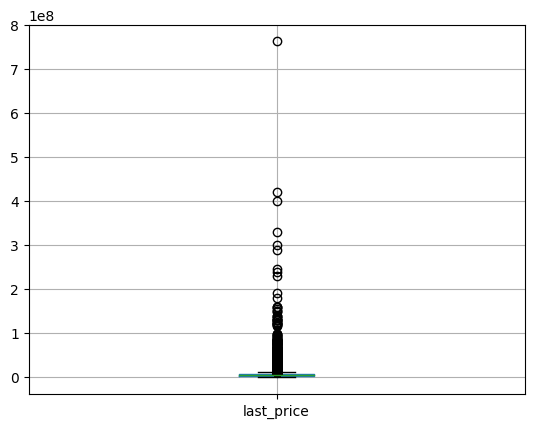

In [82]:
data.boxplot('last_price');

The interquartile range of prices is from 3.4 million rubles. up to 6.8 million rubles The smallest price is 12 thousand rubles, which is most likely a mistake. The maximum value reaches 760 million rubles. and almost 2 times higher than the second maximum value.
We appreciated the reality of such prices by looking at several sites for the sale of real estate in the city of St. Petersburg. As it turned out, such high prices really exist and there are no mistakes here, but questions about the minimum are open. Let's display the corresponding lines of the dataset.

In [83]:
# showing anomalies
display(data[data['last_price'] > 200000000].sort_values('last_price', ascending=False))
display(data[data['last_price'] < 500000].sort_values('last_price'))

,total_images,last_price,total_area,first_day_exposition,rooms,ceiling_height,floors_total,living_area,floor,is_apartment,studio,open_plan,kitchen_area,balcony,locality_name,airports_nearest,cityCenters_nearest,parks_around3000,parks_nearest,ponds_around3000,ponds_nearest,days_exposition,sale_failed,last_day_exposition,locality_type
12971,19,763000000,400.0,2017-09-30,7,2.6,10,250.0,10,True,False,False,-1.0,2,Санкт-Петербург,25108,3956,1,530,3,756,33,False,2017-11-02,город федерального значения
19540,8,420000000,900.0,2017-12-06,12,2.8,25,409.7,25,True,False,False,112.0,-1,Санкт-Петербург,30706,7877,0,-2,2,318,106,False,2018-03-22,город федерального значения
14706,15,401300000,401.0,2016-02-20,5,2.6,9,204.0,9,False,False,False,24.0,3,Санкт-Петербург,21912,2389,1,545,1,478,393,False,2017-03-19,город федерального значения
1436,19,330000000,190.0,2018-04-04,3,3.5,7,95.0,5,True,False,False,40.0,-1,Санкт-Петербург,23011,1197,3,519,3,285,233,False,2018-11-23,город федерального значения
15651,20,300000000,618.0,2017-12-18,7,3.4,7,258.0,5,True,False,False,70.0,-1,Санкт-Петербург,32440,5297,0,-2,2,198,111,False,2018-04-08,город федерального значения
22831,18,289238400,187.5,2019-03-19,2,3.4,6,63.7,6,True,False,False,30.2,-1,Санкт-Петербург,22494,1073,3,386,3,188,45,True,2019-05-03,город федерального значения
16461,17,245000000,285.7,2017-04-10,6,3.4,7,182.8,4,True,False,False,29.8,-1,Санкт-Петербург,33143,6235,3,400,3,140,249,False,2017-12-15,город федерального значения
13749,7,240000000,410.0,2017-04-01,6,3.4,7,218.0,7,True,False,False,40.0,0,Санкт-Петербург,32440,5297,0,-2,2,198,199,False,2017-10-17,город федерального значения
5893,3,230000000,500.0,2017-05-31,6,2.6,7,-1.0,7,True,False,False,40.0,0,Санкт-Петербург,32440,5297,0,-2,2,198,50,False,2017-07-20,город федерального значения


,total_images,last_price,total_area,first_day_exposition,rooms,ceiling_height,floors_total,living_area,floor,is_apartment,studio,open_plan,kitchen_area,balcony,locality_name,airports_nearest,cityCenters_nearest,parks_around3000,parks_nearest,ponds_around3000,ponds_nearest,days_exposition,sale_failed,last_day_exposition,locality_type
8793,7,12190,109.0,2019-03-20,2,2.8,25,32.0,25,True,False,False,40.5,-1,Санкт-Петербург,36421,9176,1,805,0,-2,8,False,2019-03-28,город федерального значения
14911,5,430000,54.0,2018-06-26,2,2.6,3,-1.0,3,True,False,False,-1.0,-1,поселок Свирь,-1,-1,-1,-1,-1,-1,44,False,2018-08-09,поселок
17456,7,430000,30.4,2019-04-22,1,2.6,2,16.0,1,True,False,False,6.0,-1,Сланцы,-1,-1,-1,-1,-1,-1,11,True,2019-05-03,город
16274,18,440000,40.0,2018-07-10,1,2.6,5,-1.0,1,True,False,False,-1.0,-1,деревня Старополье,-1,-1,-1,-1,-1,-1,45,False,2018-08-24,деревня
5698,7,450000,42.0,2017-07-31,2,2.6,1,23.0,1,True,False,False,5.8,-1,поселок Будогощь,-1,-1,-1,-1,-1,-1,233,False,2018-03-21,поселок
9581,7,450000,43.4,2018-08-31,2,2.6,5,30.3,3,True,False,False,5.5,-1,деревня Старополье,-1,-1,-1,-1,-1,-1,96,False,2018-12-05,деревня
16219,14,450000,38.5,2018-07-11,2,2.6,2,-1.0,1,True,False,False,-1.0,-1,деревня Вахнова Кара,-1,-1,-1,-1,-1,-1,45,False,2018-08-25,деревня
17676,0,450000,36.5,2018-02-01,1,2.6,5,17.3,4,True,False,False,8.5,1,деревня Ям-Тесово,-1,-1,-1,-1,-1,-1,120,False,2018-06-01,деревня
18867,1,470000,41.0,2018-02-11,1,2.6,5,32.0,3,True,False,False,9.0,-1,деревня Выскатка,-1,-1,-1,-1,-1,-1,46,False,2018-03-29,деревня
21912,0,470000,37.0,2018-02-18,1,2.6,3,-1.0,3,True,False,False,-1.0,-1,поселок Совхозный,-1,-1,-1,-1,-1,-1,45,False,2018-04-04,поселок


The input error of the apartment with the lowest price becomes apparent. Basically, low prices are set in villages and villages, and the apartment in line No. 8793 is located in St. Petersburg, has an area of ​​​​more than 100 square meters, while more than 30 times cheaper than the village ones. We will not correct the price by replacing it with the median value, since the apartment is located on the last (25th) floor of a high-rise building 9 km from the city center and, for sure, has a price much higher than the market price. It’s also impossible to guess the cost, it can be either 12 million or 120 million, depending on parameters that are not indicated in the dataset (for example, the quality of repairs, furniture, etc.). It is better to remove it from the dataset along with rare and abnormally expensive apartments that cost more than 200 million rubles.

In [84]:
filtered = len(data[(data['last_price'] == 12190) | (data['last_price'] > 200000000)])
print('number of anomalies:', filtered)
data2 = data.drop(data[(data['last_price'] == 12190) | (data['last_price'] > 200000000)].index).reset_index(drop=True)

number of anomalies: 10


##### Anomalies in `total_area`, `living_area` and `kitchen_area`
Let's study `total_area` in detail. Let's take a look at oversized rooms.

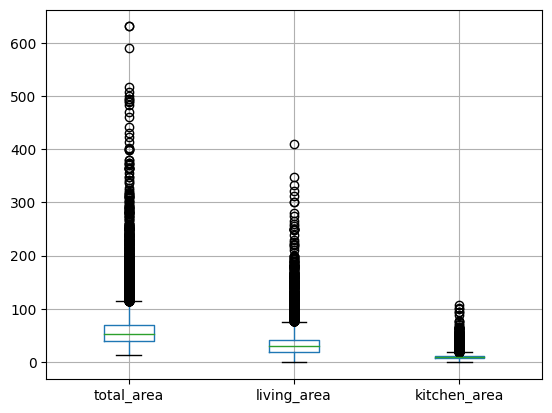

In [85]:
data2[['total_area', 'living_area', 'kitchen_area']].boxplot();

In [86]:
# show spacious apartments
display(data2[data2['total_area'] > 400].sort_values('total_area', ascending=False))
display(data2[data2['living_area'] > 300].sort_values('living_area', ascending=False))
display(data2[data2['kitchen_area'] > 80].sort_values('kitchen_area', ascending=False))

,total_images,last_price,total_area,first_day_exposition,rooms,ceiling_height,floors_total,living_area,floor,is_apartment,studio,open_plan,kitchen_area,balcony,locality_name,airports_nearest,cityCenters_nearest,parks_around3000,parks_nearest,ponds_around3000,ponds_nearest,days_exposition,sale_failed,last_day_exposition,locality_type
12856,20,140000000,631.20,2019-04-09,7,3.9,4,322.3,4,True,False,False,19.50,1,Санкт-Петербург,25707,4972,0,-2,2,210,24,True,2019-05-03,город федерального значения
3116,19,140000000,631.00,2019-03-30,7,2.6,5,-1.0,5,True,False,False,60.00,-1,Санкт-Петербург,25707,4972,0,-2,2,210,34,True,2019-05-03,город федерального значения
5357,20,65000000,590.00,2019-02-14,15,3.5,6,409.0,3,True,False,False,100.00,-1,Санкт-Петербург,24447,4666,1,767,0,-2,14,False,2019-02-28,город федерального значения
4236,1,50000000,517.00,2017-10-14,7,2.6,4,332.0,3,True,False,False,22.00,-1,Санкт-Петербург,22835,1847,2,477,2,540,566,True,2019-05-03,город федерального значения
8016,20,84000000,507.00,2015-12-17,5,4.5,7,301.5,7,True,False,False,45.50,1,Санкт-Петербург,-1,5735,2,110,0,-2,1078,False,2018-11-29,город федерального значения
15010,8,150000000,500.00,2016-01-13,4,3.2,7,-1.0,7,True,False,False,-1.00,0,Санкт-Петербург,33058,6150,3,209,3,531,303,False,2016-11-11,город федерального значения
12398,20,91500000,495.00,2017-06-19,7,4.7,7,347.5,7,True,False,False,25.00,0,Санкт-Петербург,-1,5735,2,110,0,-2,14,False,2017-07-03,город федерального значения
9823,1,43185328,494.10,2017-05-12,1,2.9,12,-1.0,3,True,False,False,-1.00,0,Санкт-Петербург,28529,6832,1,592,0,-2,5,False,2017-05-17,город федерального значения
22485,7,91075000,491.00,2017-05-27,5,4.2,9,274.0,9,True,False,False,45.00,0,Санкт-Петербург,25525,5845,2,116,0,-2,115,False,2017-09-19,город федерального значения
6619,20,99000000,488.00,2017-04-09,5,3.0,20,216.0,17,True,False,False,50.00,-1,Санкт-Петербург,27641,4598,1,646,1,368,351,False,2018-03-26,город федерального значения


,total_images,last_price,total_area,first_day_exposition,rooms,ceiling_height,floors_total,living_area,floor,is_apartment,studio,open_plan,kitchen_area,balcony,locality_name,airports_nearest,cityCenters_nearest,parks_around3000,parks_nearest,ponds_around3000,ponds_nearest,days_exposition,sale_failed,last_day_exposition,locality_type
5357,20,65000000,590.0,2019-02-14,15,3.5,6,409.0,3,True,False,False,100.0,-1,Санкт-Петербург,24447,4666,1,767,0,-2,14,False,2019-02-28,город федерального значения
12398,20,91500000,495.0,2017-06-19,7,4.7,7,347.5,7,True,False,False,25.0,0,Санкт-Петербург,-1,5735,2,110,0,-2,14,False,2017-07-03,город федерального значения
4236,1,50000000,517.0,2017-10-14,7,2.6,4,332.0,3,True,False,False,22.0,-1,Санкт-Петербург,22835,1847,2,477,2,540,566,True,2019-05-03,город федерального значения
12856,20,140000000,631.2,2019-04-09,7,3.9,4,322.3,4,True,False,False,19.5,1,Санкт-Петербург,25707,4972,0,-2,2,210,24,True,2019-05-03,город федерального значения
660,3,49950000,483.9,2017-10-04,7,3.2,6,312.5,4,True,False,False,26.4,-1,Санкт-Петербург,23079,945,3,461,3,22,391,False,2018-10-30,город федерального значения
8016,20,84000000,507.0,2015-12-17,5,4.5,7,301.5,7,True,False,False,45.5,1,Санкт-Петербург,-1,5735,2,110,0,-2,1078,False,2018-11-29,город федерального значения


,total_images,last_price,total_area,first_day_exposition,rooms,ceiling_height,floors_total,living_area,floor,is_apartment,studio,open_plan,kitchen_area,balcony,locality_name,airports_nearest,cityCenters_nearest,parks_around3000,parks_nearest,ponds_around3000,ponds_nearest,days_exposition,sale_failed,last_day_exposition,locality_type
20206,2,85000000,249.7,2018-02-01,3,2.6,10,72.0,9,True,False,False,107.0,4,Санкт-Петербург,31532,4624,1,2218,2,99,26,False,2018-02-27,город федерального значения
2488,9,12500000,255.0,2017-04-21,3,2.6,2,153.9,2,True,False,False,100.7,0,Санкт-Петербург,29544,6916,0,-2,3,198,102,False,2017-08-01,город федерального значения
5357,20,65000000,590.0,2019-02-14,15,3.5,6,409.0,3,True,False,False,100.0,-1,Санкт-Петербург,24447,4666,1,767,0,-2,14,False,2019-02-28,город федерального значения
16232,5,82400000,181.1,2017-05-24,3,3.9,9,58.2,4,False,False,False,93.2,-1,Санкт-Петербург,25525,5845,2,116,0,-2,501,False,2018-10-07,город федерального значения
16789,9,65850000,146.0,2017-07-14,2,2.6,9,40.0,3,True,False,False,93.0,0,Санкт-Петербург,25525,5845,2,116,0,-2,77,False,2017-09-29,город федерального значения
10864,1,56844500,177.9,2015-01-15,3,2.6,6,87.2,5,True,False,False,87.2,-1,Санкт-Петербург,21860,318,2,160,3,569,1569,True,2019-05-03,город федерального значения


In [87]:
# deleting anomalies
filtered += len(data2[(data2['total_area'] > 500) | (data2['living_area'] > 300) | (data2['kitchen_area'] > 100)])
print('number of deleted anomalies:', filtered)
data2 = (data2.drop(data2[(data2['total_area'] > 500) | (data2['living_area'] > 300) | (data2['kitchen_area'] > 100)].index)
         .reset_index(drop=True))

number of deleted anomalies: 19


The data, although rare, is plausible - they have a high price, a large number of rooms and they are located in St. Petersburg, the presence of the number of storeys of buildings suggests that these are most likely penthouses, combined apartments or commercial premises. We leave them unchanged. The same will apply to `living_area` with `kitchen_area`. We can check if their sum exceeds the total area.

In [88]:
# show apartments, the sum of the living and kitchen areas of which exceeds the total area of the apartment
display(data2[data2['living_area'] + data2['kitchen_area'] > data2['total_area']])

,total_images,last_price,total_area,first_day_exposition,rooms,ceiling_height,floors_total,living_area,floor,is_apartment,studio,open_plan,kitchen_area,balcony,locality_name,airports_nearest,cityCenters_nearest,parks_around3000,parks_nearest,ponds_around3000,ponds_nearest,days_exposition,sale_failed,last_day_exposition,locality_type
184,7,2600000,30.20,2018-02-14,1,2.6,9,26.10,5,True,False,False,6.20,-1,Санкт-Петербург,13952,15031,0,-2,1,824,12,False,2018-02-26,город федерального значения
545,9,4700000,23.80,2018-12-28,1,2.6,18,20.00,9,True,False,False,5.00,-1,Санкт-Петербург,9731,11849,0,-2,0,-2,108,False,2019-04-15,город федерального значения
551,8,3100000,31.59,2018-03-08,1,2.7,19,30.55,2,True,False,False,9.28,2,поселок Мурино,-1,-1,-1,-1,-1,-1,70,False,2018-05-17,поселок
601,12,5600000,53.70,2017-04-18,2,2.5,12,48.30,5,True,False,False,7.00,2,Санкт-Петербург,50477,13252,2,220,1,1250,167,False,2017-10-02,город федерального значения
695,1,3364930,34.69,2014-11-27,1,2.6,25,23.43,25,True,False,False,23.43,2,Санкт-Петербург,43396,12153,0,-2,0,-2,574,False,2016-06-23,город федерального значения
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
21806,20,2450000,44.00,2019-02-12,2,2.7,2,38.00,2,False,False,False,8.60,2,поселок Большая Ижора,-1,-1,-1,-1,-1,-1,80,True,2019-05-03,поселок
21850,12,2600000,34.30,2018-09-26,1,2.5,9,30.60,6,True,False,False,8.00,2,Сосновый Бор,-1,-1,-1,-1,-1,-1,107,False,2019-01-11,город
21897,14,11990000,91.40,2016-05-16,2,2.6,16,62.00,12,True,False,False,32.40,0,Санкт-Петербург,10934,12551,0,-2,0,-2,93,False,2016-08-17,город федерального значения
21938,0,5200000,46.00,2018-07-20,2,2.6,5,44.00,5,True,False,False,8.00,1,Санкт-Петербург,14103,15182,1,488,0,-2,7,False,2018-07-27,город федерального значения


Mathematical errors were identified for 64 apartments. Despite the data errors, we will not correct them, because we do not know which parameter is not correct. Usually, the object passport indicates the total area of the property and most likely the `total_area` column stores the correct values, and the error is in the `living_area` or `kitchen_area` columns.

##### Anomalies in `rooms`


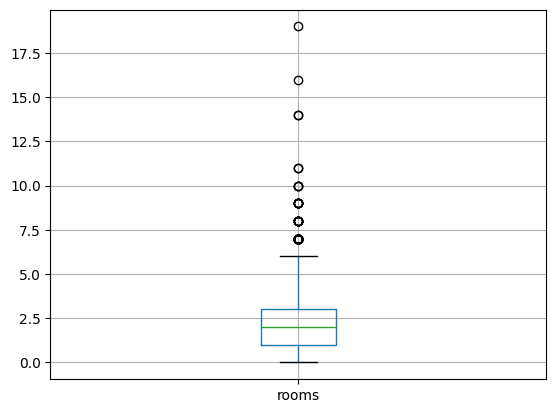

In [89]:
data2.boxplot('rooms');

The number of rooms in the dataset varies from `0` to `19`. Let's check the unlikely values.

In [90]:
data2[data2['rooms'] == 0].describe()

,total_images,last_price,total_area,rooms,ceiling_height,floors_total,living_area,floor,kitchen_area,balcony,airports_nearest,cityCenters_nearest,parks_around3000,parks_nearest,ponds_around3000,ponds_nearest,days_exposition
count,197.000000,1.970000e+02,197.000000,197.0,197.000000,197.000000,197.000000,197.000000,197.000000,197.000000,197.000000,197.000000,197.000000,197.000000,197.000000,197.000000,197.000000
mean,7.776650,3.337724e+06,29.279746,0.0,2.688832,16.827411,17.453503,8.578680,-0.299492,0.649746,14684.568528,8019.172589,-0.223350,86.263959,0.091371,183.350254,121.350254
std,5.079055,5.046022e+06,25.855264,0.0,0.269499,6.912032,8.125073,6.290595,0.459203,1.349286,15385.567325,7640.516367,0.769881,240.789860,1.121122,299.718549,205.222115
min,0.000000,9.457500e+05,15.500000,0.0,2.500000,3.000000,-1.000000,1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-2.000000,-1.000000,-2.000000,3.000000
25%,4.000000,2.300000e+06,24.050000,0.0,2.600000,12.000000,15.800000,3.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-2.000000,-1.000000,-1.000000,27.000000
50%,7.000000,2.700000e+06,26.050000,0.0,2.600000,17.000000,18.000000,7.000000,0.000000,1.000000,11555.000000,8264.000000,0.000000,-1.000000,0.000000,-1.000000,50.000000
75%,11.000000,3.380000e+06,28.400000,0.0,2.700000,23.000000,19.200000,13.000000,0.000000,2.000000,22807.000000,14289.000000,0.000000,-1.000000,1.000000,366.000000,120.000000
max,21.000000,7.100000e+07,371.000000,0.0,5.800000,35.000000,68.000000,26.000000,0.000000,2.000000,55551.000000,29846.000000,2.000000,1199.000000,3.000000,1159.000000,1542.000000


In [91]:
display(data2[(data2['rooms'] == 0) & (data2['total_area'] > 30)])

,total_images,last_price,total_area,first_day_exposition,rooms,ceiling_height,floors_total,living_area,floor,is_apartment,studio,open_plan,kitchen_area,balcony,locality_name,airports_nearest,cityCenters_nearest,parks_around3000,parks_nearest,ponds_around3000,ponds_nearest,days_exposition,sale_failed,last_day_exposition,locality_type
508,0,3375000,34.40,2017-03-28,0,2.6,26,24.30,19,True,False,True,-1.0,1,поселок Парголово,53115,19292,0,-2,1,593,430,False,2018-06-01,поселок
838,14,1900000,35.00,2017-04-14,0,2.7,5,15.00,3,False,False,True,-1.0,1,поселок Новый Свет,-1,-1,-1,-1,-1,-1,7,False,2017-04-21,поселок
1173,3,3900000,32.00,2016-10-18,0,2.7,24,18.00,2,True,True,False,0.0,2,Санкт-Петербург,44754,8409,1,609,0,-2,540,False,2018-04-11,город федерального значения
1526,8,1950000,31.00,2019-01-29,0,2.6,18,18.00,11,True,True,False,0.0,2,Никольское,-1,-1,-1,-1,-1,-1,94,True,2019-05-03,город
3143,7,2170000,31.00,2017-12-30,0,2.6,12,-1.00,12,True,True,False,0.0,-1,Тосно,-1,-1,-1,-1,-1,-1,198,False,2018-07-16,город
3454,6,7400000,73.60,2017-05-18,0,2.6,3,50.00,1,True,True,False,0.0,0,Санкт-Петербург,26581,6085,0,-2,1,348,60,False,2017-07-17,город федерального значения
4678,2,3650000,35.00,2018-02-01,0,2.6,25,23.40,25,True,False,True,-1.0,-1,Санкт-Петербург,43431,12188,0,-2,0,-2,100,False,2018-05-12,город федерального значения
5951,1,3200000,30.30,2018-09-07,0,2.6,14,-1.00,13,True,True,False,0.0,-1,Санкт-Петербург,22735,11618,1,835,1,652,68,False,2018-11-14,город федерального значения
6213,0,1100000,32.00,2018-03-06,0,2.7,3,20.00,1,True,True,False,0.0,-1,поселок Большая Ижора,-1,-1,-1,-1,-1,-1,70,False,2018-05-15,поселок
6798,7,1850000,31.00,2017-11-10,0,2.6,18,18.00,10,True,False,True,-1.0,1,Никольское,-1,-1,-1,-1,-1,-1,7,False,2017-11-17,город


With the exception of 4 cases, apartments with `0` rooms are small, most likely `1` room instead of `0`.

In [92]:
# replacing 0 to 1
data2.loc[data2['rooms'] == 0, 'rooms'] = 1

Having dealt with abnormally low values, we look at high ones.

In [93]:
display(data2[(data2['rooms'] > 9)].sort_values('rooms', ascending=False))

,total_images,last_price,total_area,first_day_exposition,rooms,ceiling_height,floors_total,living_area,floor,is_apartment,studio,open_plan,kitchen_area,balcony,locality_name,airports_nearest,cityCenters_nearest,parks_around3000,parks_nearest,ponds_around3000,ponds_nearest,days_exposition,sale_failed,last_day_exposition,locality_type
14485,6,32250000,374.6,2018-06-09,19,2.6,5,264.5,2,True,False,False,27.6,-1,Санкт-Петербург,19497,3574,0,-2,2,548,114,False,2018-10-01,город федерального значения
18832,6,28500000,270.0,2015-03-02,16,3.0,4,180.0,4,True,False,False,13.0,1,Санкт-Петербург,23575,4142,1,516,0,-2,1365,False,2018-11-26,город федерального значения
865,5,25000000,363.0,2017-12-23,14,3.2,5,222.0,4,True,False,False,16.6,-1,Санкт-Петербург,38076,7950,0,-2,2,435,418,False,2019-02-14,город федерального значения
20811,6,28659000,245.4,2016-03-31,14,2.6,4,168.3,2,True,False,False,25.9,0,Санкт-Петербург,21104,2054,3,541,2,118,95,False,2016-07-04,город федерального значения
648,3,17500000,183.7,2018-07-01,11,3.4,7,138.8,7,True,False,False,13.3,-1,Санкт-Петербург,23606,3148,0,-2,0,-2,306,True,2019-05-03,город федерального значения
9679,8,33000000,194.1,2017-02-07,11,3.4,5,129.0,2,True,False,False,11.9,-1,Санкт-Петербург,21469,1015,1,686,2,66,813,False,2019-05-01,город федерального значения
4145,6,23000000,272.6,2018-01-11,10,3.1,7,145.9,7,True,False,False,18.8,1,Санкт-Петербург,10726,12169,1,191,1,531,477,True,2019-05-03,город федерального значения
18103,4,15500000,216.1,2016-07-04,10,3.1,5,161.4,2,True,False,False,19.8,0,Санкт-Петербург,24353,4921,1,368,0,-2,11,False,2016-07-15,город федерального значения
18875,11,40000000,290.0,2016-06-21,10,3.5,6,189.4,6,True,False,False,30.0,1,Санкт-Петербург,26229,4932,3,316,1,227,77,False,2016-09-06,город федерального значения


All apartments with a large number of rooms have a large area, we will remove excessively high and rare values.

In [94]:
# deleting anomalies
filtered += len(data2[(data2['rooms'] > 9)])
print('number of deleted anomalies:', filtered)
data2 = data2.drop(data2[(data2['rooms'] > 9)].index).reset_index(drop=True)

number of deleted anomalies: 28


##### Anomalies in `ceiling_height`
Earlier, we studied the `ceiling_height` values in detail and determined that the ceiling height in standard apartments can vary from 2.4 to more than 3 meters. At the same time, low ceilings within reasonable limits are allowed in basements and attics (up to 2 m), and in elite, converted or historical premises, the height can be an order of magnitude higher than average, especially in the first (converted commercial premises) or the latter (penthouses or combined apartments) floors.

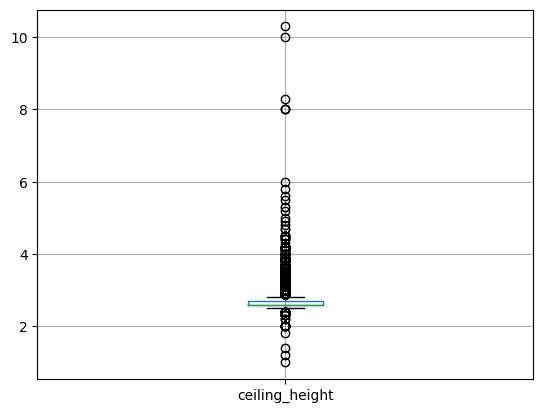

In [95]:
data2.boxplot('ceiling_height');

In [96]:
display(data2.query('ceiling_height >= 8').sort_values('ceiling_height', ascending=False))

,total_images,last_price,total_area,first_day_exposition,rooms,ceiling_height,floors_total,living_area,floor,is_apartment,studio,open_plan,kitchen_area,balcony,locality_name,airports_nearest,cityCenters_nearest,parks_around3000,parks_nearest,ponds_around3000,ponds_nearest,days_exposition,sale_failed,last_day_exposition,locality_type
22282,20,5300000,45.0,2017-09-30,1,10.3,16,15.5,15,True,False,False,-1.0,-1,Санкт-Петербург,36353,11936,2,440,2,450,136,False,2018-02-13,город федерального значения
22841,0,15000000,25.0,2018-07-25,1,10.0,5,14.0,5,True,False,False,11.0,5,Санкт-Петербург,34963,8283,1,223,3,30,19,False,2018-08-13,город федерального значения
5854,20,5650000,45.0,2018-08-15,1,8.3,16,19.3,14,True,False,False,8.3,1,Санкт-Петербург,13069,10763,0,-2,1,613,14,False,2018-08-29,город федерального значения
3468,3,1400000,30.0,2018-03-16,1,8.0,5,15.3,2,False,False,False,7.3,-1,деревня Нурма,-1,-1,-1,-1,-1,-1,125,False,2018-07-19,деревня
15723,14,5600000,67.0,2016-11-11,3,8.0,16,41.0,1,True,False,False,8.0,-1,Санкт-Петербург,32691,11035,1,723,0,-2,474,False,2018-02-28,город федерального значения
17421,0,5350000,54.0,2015-06-16,2,8.0,5,29.0,2,True,False,False,-1.0,1,Красное Село,24638,28062,0,-2,0,-2,469,False,2016-09-27,город


We will exclude from the new dataset rooms with ceilings below 2 meters, as well as rooms with high ceilings (8 meters or more).

In [97]:
# deleting anomalies
filtered += len(data2[(data2['ceiling_height'] < 2) | (data2['ceiling_height'] >= 8)])
print('number of deleted anomalies:', filtered)
data2 = (data2.drop(data2[(data2['ceiling_height'] < 2) | (data2['ceiling_height'] >= 8)].index))

number of deleted anomalies: 38


In [52]:
# проверка
display(data2.query('ceiling_height >= 8').sort_values('ceiling_height', ascending=False))

,total_images,last_price,total_area,first_day_exposition,rooms,ceiling_height,floors_total,living_area,floor,is_apartment,studio,open_plan,kitchen_area,balcony,locality_name,airports_nearest,cityCenters_nearest,parks_around3000,parks_nearest,ponds_around3000,ponds_nearest,days_exposition,sale_failed,last_day_exposition,locality_type


##### Anomalies in `floor` and `floors_total`


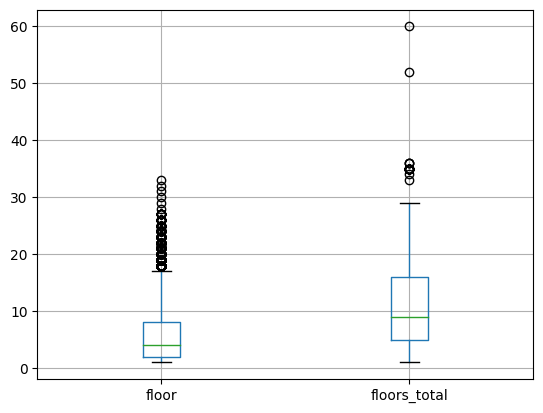

In [99]:
data2[['floor', 'floors_total']].boxplot();

In [100]:
# deleting anomalies
filtered += len(data2[(data2['floor'] >= 30) | (data2['floors_total'] >= 30)])
print('number of deleted anomalies:', filtered)
data2 = (data2.drop(data2[(data2['floor'] >= 30) | (data2['floors_total'] >= 30)].index))

number of deleted anomalies: 69


##### Anomlaies in `days_exposition`

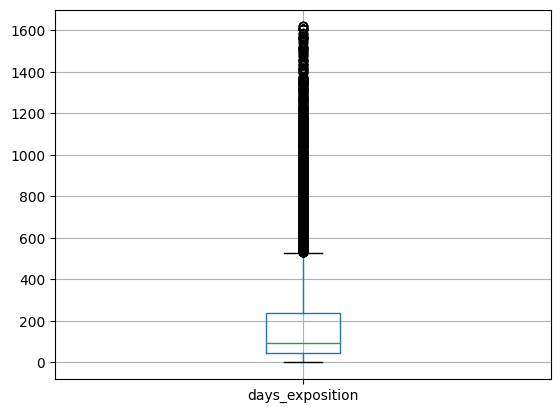

In [101]:
data2.boxplot('days_exposition');

There are no rare outliers in the `days_exposition` column.

#### Data preprocessing conclusions
During preprocessing, the following actions were carried out:

- `total_images` column remained untouched.
- `last_price` prices checked for validity, erroneous and rare values ​​removed.
- the realism of the `total_area` values ​​was checked, in `living_area` and `kitchen_area` the detected errors were left unchanged, and the gaps were replaced by `-1`. For studio apartments, `kitchen_area` is fixed to `0`. Removed anomalies.
- `first_day_exposition` column converted to `datetime64[ns]` format to work with time.
- after checking for outliers in the `rooms` column, zero values ​​are replaced by `1`, outliers are removed.
- Abnormally high values ​​in the `ceiling_height` column are corrected (for example, the values ​​of `24.` are given in `2.4`), values ​​are rounded to the nearest tenth place, and gaps are replaced by the median value. Removed outliers - values ​​below 2m and also above 8m.
- the `floors_total` column is dominated by low- and mid-rise buildings, respectively, we cannot assign a median value to gaps, otherwise it will turn out that the floors of some apartments will be higher than the total number of storeys of the building. In this regard, the total number of floors is assigned the value of the floor, increased by one, so as not to distort the subsequent analysis. Removed outliers
- in the `is_apartment` column, gaps have been replaced with `True`, because Logically, the dataset is represented in most apartments.
- in the `locality_name` column, the nature of the gaps is not defined, the gaps are replaced by `'n/d'`, implicit duplicates are fixed and a new category is created by the type of settlement (`city of federal significance`, `city`, `town`, `village `, `villages and others`, `n/d`)
- in the `balcony`, `airports_nearest` and `cityCenters_nearest` columns, the nature of the gaps is also not defined, the gaps are assigned a categorical value of `-1`.
- in columns `parks_around3000`, `parks_nearest`, `ponds_around3000` and `ponds_nearest`, values ​​that do not have map data are assigned the categorical value `-1`. Other gaps, in cases where the values ​​of `parks_around3000` and `ponds_around3000` are `0`, are assigned a categorical value of `-2`.
- in the `days_exposition` column for passes, the number of days from the date of publication to the date of removal of the last announcement is calculated. In case gaps in this column mean that the publication was never taken down, a separate `sale_failed` column was created with the status of the announcement.
- all values ​​are given in the appropriate formats.

In [102]:
# final check
data2.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 23630 entries, 0 to 23670
Data columns (total 25 columns):
 #   Column                Non-Null Count  Dtype         
---  ------                --------------  -----         
 0   total_images          23630 non-null  int64         
 1   last_price            23630 non-null  int64         
 2   total_area            23630 non-null  float64       
 3   first_day_exposition  23630 non-null  datetime64[ns]
 4   rooms                 23630 non-null  int64         
 5   ceiling_height        23630 non-null  float64       
 6   floors_total          23630 non-null  int64         
 7   living_area           23630 non-null  float64       
 8   floor                 23630 non-null  int64         
 9   is_apartment          23630 non-null  bool          
 10  studio                23630 non-null  bool          
 11  open_plan             23630 non-null  bool          
 12  kitchen_area          23630 non-null  float64       
 13  balcony         

### Adding new columns to the table

New columns must be added to the table with the following parameters:
- the price of one square meter.
- day of the week when the announcement was published (`0` — Monday, `1` — Tuesday, and so on).
- Month of publication of the announcement.
- year of publication of the announcement.
- apartment floor type (`first`, `last`, `other`)
- distance to the city center in kilometers.

In [103]:
# price of 1 square meter
data2['price_per_area'] = (data2['last_price'] / data2['total_area']).round(2)
# day of week of publication
data2['day_of_week'] = data2['first_day_exposition'].dt.dayofweek
# month of publication
data2['month'] = data2['first_day_exposition'].dt.month
# year of publication
data2['year'] = data2['first_day_exposition'].dt.year
# distance to city centre in kilometers
data2['to_center'] = -1
data2.loc[data2['cityCenters_nearest'] >= 0, 'to_center'] = (data2['cityCenters_nearest'] / 1000).round().astype(int)
# floor categories
floor_conditions = [data2['floor'] == 1, data2['floor'] == data2['floors_total'], data2['floor'] <= 0]
floor_types = ['первый', 'последний', 'нулевой/отрицательный']
data2['floor_type'] = np.select(floor_conditions, floor_types, 'другой')
# sort the columns
data2 = data2.reindex(columns=['total_area', 'living_area', 'kitchen_area', 'last_price', 'price_per_area', 'rooms',
                               'ceiling_height', 'balcony', 'floor', 'floor_type', 'floors_total', 'is_apartment',
                               'studio', 'open_plan', 'locality_name', 'locality_type', 'cityCenters_nearest', 
                               'to_center', 'airports_nearest', 'parks_around3000','parks_nearest', 'ponds_around3000',
                               'ponds_nearest', 'first_day_exposition', 'year', 'month', 'day_of_week', 'days_exposition',
                               'sale_failed', 'total_images'])
# check
display(data2.head())

,total_area,living_area,kitchen_area,last_price,price_per_area,rooms,ceiling_height,balcony,floor,floor_type,floors_total,is_apartment,studio,open_plan,locality_name,locality_type,cityCenters_nearest,to_center,airports_nearest,parks_around3000,parks_nearest,ponds_around3000,ponds_nearest,first_day_exposition,year,month,day_of_week,days_exposition,sale_failed,total_images
0,108.0,51.0,25.0,13000000,120370.37,3,2.7,-1,8,другой,16,True,False,False,Санкт-Петербург,город федерального значения,16028,16,18863,1,482,2,755,2019-03-07,2019,3,3,57,True,20
1,40.4,18.6,11.0,3350000,82920.79,1,2.6,2,1,первый,11,True,False,False,поселок Шушары,поселок,18603,19,12817,0,-2,0,-2,2018-12-04,2018,12,1,81,False,7
2,56.0,34.3,8.3,5196000,92785.71,2,2.6,0,4,другой,5,True,False,False,Санкт-Петербург,город федерального значения,13933,14,21741,1,90,2,574,2015-08-20,2015,8,3,558,False,10
3,159.0,-1.0,-1.0,64900000,408176.10,3,2.6,0,9,другой,14,True,False,False,Санкт-Петербург,город федерального значения,6800,7,28098,2,84,3,234,2015-07-24,2015,7,4,424,False,0
4,100.0,32.0,41.0,10000000,100000.00,2,3.0,-1,13,другой,14,True,False,False,Санкт-Петербург,город федерального значения,8098,8,31856,2,112,1,48,2018-06-19,2018,6,1,121,False,2


### Research

Let's start analyzing the data:
- we will study in detail the individual parameters of objects.
- Analyze the rate of sale of apartments.
- evaluate the influence of various factors on the cost of objects.
- we will analyze the prices in different settlements.
- we will determine the dependence of the price on the location relative to the city center.

#### Individual object parameters
In the course of data preprocessing, most of the parameters have already been studied, here we will refresh our observations according to the conditions of the task.

##### `total_area`

In [105]:
# show top-5 big and small apartments, statistics and histogram by total area
display(data2.sort_values('total_area', ascending=False).head())
display(data2.sort_values('total_area').head())
print(data2['total_area'].describe())
fig_total_area = px.histogram(data2, x='total_area', nbins=100, marginal='box', title='Total area', 
                              labels={'total_area' : 'Total area'})
fig_total_area.show()

,total_area,living_area,kitchen_area,last_price,price_per_area,rooms,ceiling_height,balcony,floor,floor_type,floors_total,is_apartment,studio,open_plan,locality_name,locality_type,cityCenters_nearest,to_center,airports_nearest,parks_around3000,parks_nearest,ponds_around3000,ponds_nearest,first_day_exposition,year,month,day_of_week,days_exposition,sale_failed,total_images
14997,500.0,-1.0,-1.0,150000000,300000.00,4,3.2,0,7,последний,7,True,False,False,Санкт-Петербург,город федерального значения,6150,6,33058,3,209,3,531,2016-01-13,2016,1,2,303,False,8
9813,494.1,-1.0,-1.0,43185328,87402.00,1,2.9,0,3,другой,12,True,False,False,Санкт-Петербург,город федерального значения,6832,7,28529,1,592,0,-2,2017-05-12,2017,5,4,5,False,1
22467,491.0,274.0,45.0,91075000,185488.80,5,4.2,0,9,последний,9,True,False,False,Санкт-Петербург,город федерального значения,5845,6,25525,2,116,0,-2,2017-05-27,2017,5,5,115,False,7
6611,488.0,216.0,50.0,99000000,202868.85,5,3.0,-1,17,другой,20,True,False,False,Санкт-Петербург,город федерального значения,4598,5,27641,1,646,1,368,2017-04-09,2017,4,6,351,False,20
6211,470.3,248.7,40.0,34000000,72294.28,4,2.6,-1,3,последний,3,True,False,False,Санкт-Петербург,город федерального значения,15459,15,43756,1,852,3,122,2018-01-14,2018,1,6,179,False,8


,total_area,living_area,kitchen_area,last_price,price_per_area,rooms,ceiling_height,balcony,floor,floor_type,floors_total,is_apartment,studio,open_plan,locality_name,locality_type,cityCenters_nearest,to_center,airports_nearest,parks_around3000,parks_nearest,ponds_around3000,ponds_nearest,first_day_exposition,year,month,day_of_week,days_exposition,sale_failed,total_images
19879,12.0,10.0,-1.0,2400000,200000.00,1,2.5,-1,2,другой,5,True,False,False,Санкт-Петербург,город федерального значения,964,1,21314,1,886,2,45,2017-07-19,2017,7,2,200,False,4
19521,13.0,-1.0,-1.0,1850000,142307.69,1,3.4,-1,2,другой,5,False,False,False,Санкт-Петербург,город федерального значения,5483,5,24915,1,644,0,-2,2019-03-11,2019,3,0,24,False,3
17940,13.0,-1.0,-1.0,1400000,107692.31,1,2.6,-1,1,первый,9,True,False,False,Санкт-Петербург,город федерального значения,15945,16,14350,0,-2,1,185,2017-12-03,2017,12,6,410,False,3
19782,13.0,10.0,-1.0,3800000,292307.69,1,2.6,-1,3,другой,5,True,False,False,Санкт-Петербург,город федерального значения,1242,1,21302,1,592,3,27,2018-07-04,2018,7,2,9,False,0
19533,13.2,-1.0,-1.0,1686000,127727.27,1,2.6,-1,1,первый,5,True,False,False,Санкт-Петербург,город федерального значения,4165,4,19891,1,361,1,155,2018-12-17,2018,12,0,19,False,2


count    23630.000000
mean        59.969834
std         33.330846
min         12.000000
25%         40.000000
50%         52.000000
75%         69.600000
max        500.000000
Name: total_area, dtype: float64


The ads feature a variety of apartments with a total area of 12 to 500 sq.m. The area of the bulk of the apartments is more than 27.5 sq.m, but does not exceed 115 sq.m. Apartments over 200 sq. m. are very rare cases. No errors or unrealistic values were found when checking for anomalies.

##### `living_area`

In [107]:
# show top-5 big and small apartments, statistics and histogram by living area
display(data2.sort_values('living_area', ascending=False).head())
print('number of missing values:\t', len(data2.query('living_area == -1')))
display(data2.query('living_area != -1').sort_values('living_area').head())
print(data2.query('living_area != -1')['living_area'].describe())
fig_living_area = px.histogram(data2.query('living_area != -1'), x='living_area', nbins=100, marginal='box',
                              title='Living area', labels={'living_area' : 'Living area'})
fig_living_area.show()

,total_area,living_area,kitchen_area,last_price,price_per_area,rooms,ceiling_height,balcony,floor,floor_type,floors_total,is_apartment,studio,open_plan,locality_name,locality_type,cityCenters_nearest,to_center,airports_nearest,parks_around3000,parks_nearest,ponds_around3000,ponds_nearest,first_day_exposition,year,month,day_of_week,days_exposition,sale_failed,total_images
14071,402.0,300.0,56.0,51000000,126865.67,6,3.1,2,6,другой,8,True,False,False,Санкт-Петербург,город федерального значения,5052,5,24484,1,253,0,-2,2017-02-07,2017,2,1,32,False,8
20247,460.8,279.6,55.5,20000000,43402.78,6,3.1,-1,1,первый,3,True,False,False,Санкт-Петербург,город федерального значения,15459,15,43756,1,852,3,122,2019-03-20,2019,3,2,21,False,12
22467,491.0,274.0,45.0,91075000,185488.80,5,4.2,0,9,последний,9,True,False,False,Санкт-Петербург,город федерального значения,5845,6,25525,2,116,0,-2,2017-05-27,2017,5,5,115,False,7
19840,347.0,260.0,45.0,180000000,518731.99,8,3.9,0,3,другой,6,True,False,False,Санкт-Петербург,город федерального значения,3794,4,23962,2,537,3,501,2015-01-21,2015,1,2,834,False,20
1082,323.0,255.7,66.0,75000000,232198.14,5,4.0,-1,4,другой,5,True,False,False,Санкт-Петербург,город федерального значения,594,1,23713,3,398,2,515,2017-07-10,2017,7,0,259,False,16


number of missing values:	 1900


,total_area,living_area,kitchen_area,last_price,price_per_area,rooms,ceiling_height,balcony,floor,floor_type,floors_total,is_apartment,studio,open_plan,locality_name,locality_type,cityCenters_nearest,to_center,airports_nearest,parks_around3000,parks_nearest,ponds_around3000,ponds_nearest,first_day_exposition,year,month,day_of_week,days_exposition,sale_failed,total_images
13898,52.0,2.0,9.0,6350000,122115.38,2,3.0,-1,2,другой,6,True,False,False,Санкт-Петербург,город федерального значения,6521,7,32453,0,-2,1,1012,2018-02-06,2018,2,1,91,False,20
21731,23.0,2.0,0.0,2330000,101304.35,1,2.6,-1,22,другой,24,True,True,False,поселок Мурино,поселок,-1,-1,-1,-1,-1,-1,-1,2018-01-01,2018,1,0,66,False,0
3236,41.0,3.0,11.0,4440000,108292.68,1,2.6,-1,17,последний,17,True,False,False,Санкт-Петербург,город федерального значения,13073,13,19272,0,-2,0,-2,2017-07-02,2017,7,6,216,False,7
23546,139.0,3.0,16.0,64990000,467553.96,3,3.0,1,8,последний,8,True,False,False,Санкт-Петербург,город федерального значения,5975,6,33255,1,630,3,100,2015-11-24,2015,11,1,280,False,14
17561,22.0,5.0,0.0,2680000,121818.18,1,2.6,2,8,другой,25,True,True,False,Санкт-Петербург,город федерального значения,11618,12,22735,1,835,1,652,2018-08-11,2018,8,5,70,False,11


count    21730.000000
mean        34.253371
std         20.877537
min          2.000000
25%         18.600000
50%         30.000000
75%         42.300000
max        300.000000
Name: living_area, dtype: float64


The general statistics of apartments by living area is represented by the `describe()` function and an interactive histogram. The boundaries of normal values ​​​​are from 2 to 78 sq.m.

In this parameter, values ​​for 1900 apartments were missing. In addition to omissions, there are obvious errors with an excessively small area of ​​​​living rooms relative to the total area, as well as apartments in which the sum of living and kitchen areas exceeds the total. In these cases, we believe that errors are contained precisely in the parameters of the living and kitchen area, since these areas were probably calculated independently, while the value of the total area appears more often in official documents (technical passport, contracts, etc.). In cases where the difference between the total area and the living area (together with the kitchen area) is too large, when identifying the location of the error, they were guided by the price of the property. For example, in line No. 23565, the area of ​​the apartment is 139 sq.m, although the area of ​​living rooms is only 3 sq.m., while the price of the apartment is more in line with the prices of apartments with a similar total area. Identifying and correcting all such errors requires a deeper analysis, but should not change the overall conclusion much.

##### `kitchen_area`

In [108]:
# show top-5 big and small apartments, statistics and histogram by kitchen area
display(data2.sort_values('kitchen_area', ascending=False).head())
print('number of missing values:\t', len(data2.query('kitchen_area == -1')))
display(data2.query('kitchen_area > 0').sort_values('kitchen_area').head())
print(data2.query('kitchen_area != -1')['kitchen_area'].describe())
fig_kitchen_area = px.histogram(data2.query('kitchen_area != -1'), x='kitchen_area', nbins=100, marginal='box',
                                title='Kitchen area', labels={'kitchen_area' : 'Kitchen area'})
fig_kitchen_area.show()

,total_area,living_area,kitchen_area,last_price,price_per_area,rooms,ceiling_height,balcony,floor,floor_type,floors_total,is_apartment,studio,open_plan,locality_name,locality_type,cityCenters_nearest,to_center,airports_nearest,parks_around3000,parks_nearest,ponds_around3000,ponds_nearest,first_day_exposition,year,month,day_of_week,days_exposition,sale_failed,total_images
16219,181.1,58.2,93.2,82400000,454997.24,3,3.9,-1,4,другой,9,False,False,False,Санкт-Петербург,город федерального значения,5845,6,25525,2,116,0,-2,2017-05-24,2017,5,2,501,False,5
16776,146.0,40.0,93.0,65850000,451027.40,2,2.6,0,3,другой,9,True,False,False,Санкт-Петербург,город федерального значения,5845,6,25525,2,116,0,-2,2017-07-14,2017,7,4,77,False,9
10854,177.9,87.2,87.2,56844500,319530.64,3,2.6,-1,5,другой,6,True,False,False,Санкт-Петербург,город федерального значения,318,0,21860,2,160,3,569,2015-01-15,2015,1,3,1569,True,1
492,216.0,86.0,77.0,95000000,439814.81,4,3.0,-1,4,другой,5,True,False,False,Санкт-Петербург,город федерального значения,436,0,21740,2,138,3,620,2017-12-05,2017,12,1,14,False,18
4386,174.0,95.0,77.0,57000000,327586.21,3,3.2,-1,6,другой,10,True,False,False,Санкт-Петербург,город федерального значения,4166,4,31706,1,193,3,199,2015-11-09,2015,11,0,1039,False,20


number of missing values:	 2124


,total_area,living_area,kitchen_area,last_price,price_per_area,rooms,ceiling_height,balcony,floor,floor_type,floors_total,is_apartment,studio,open_plan,locality_name,locality_type,cityCenters_nearest,to_center,airports_nearest,parks_around3000,parks_nearest,ponds_around3000,ponds_nearest,first_day_exposition,year,month,day_of_week,days_exposition,sale_failed,total_images
20191,28.5,19.5,1.3,4250000,149122.81,1,2.8,-1,10,другой,14,True,False,False,Санкт-Петербург,город федерального значения,12721,13,37199,0,-2,0,-2,2019-05-01,2019,5,2,2,True,7
19617,14.0,11.0,2.0,1190000,85000.00,1,2.6,-1,1,первый,5,True,False,False,Санкт-Петербург,город федерального значения,11122,11,9898,0,-2,0,-2,2018-07-29,2018,7,6,4,False,5
6252,24.0,16.0,2.0,3100000,129166.67,2,3.0,-1,5,последний,5,True,False,False,Санкт-Петербург,город федерального значения,4914,5,31960,2,426,1,936,2018-06-25,2018,6,0,54,False,9
903,27.0,18.0,2.0,2600000,96296.30,1,2.8,0,18,другой,23,True,False,False,Санкт-Петербург,город федерального значения,17459,17,22131,0,-2,1,411,2017-07-10,2017,7,0,10,False,15
11020,32.0,16.0,2.0,5350000,167187.50,1,2.6,0,10,другой,14,True,False,False,Санкт-Петербург,город федерального значения,3953,4,19008,0,-2,1,69,2016-04-20,2016,4,2,210,False,6


count    21506.000000
mean        10.453167
std          5.756823
min          0.000000
25%          7.000000
50%          9.000000
75%         12.000000
max         93.200000
Name: kitchen_area, dtype: float64


The general statistics of apartments by kitchen area is represented by the `describe()` function and an interactive histogram. The boundaries of normal values ​​are from 0 to 19.5 sq.m.

For 149 studio apartments, the kitchen area values have been corrected to `0`, as this type of apartment implies the absence of a separate kitchen. After the corrections, there were gaps in this parameter for 2124 apartments. Otherwise, no obvious errors were found.

##### `last_price`

In [109]:
# show top-5 most and least expensive apartments, statistics and histogram
display(data2.sort_values('last_price', ascending=False).head())
display(data2.sort_values('last_price').head())
print(data2['last_price'].describe())
fig_last_price = px.histogram(data2, x='last_price', nbins=500, marginal='box', title='Price', 
                              labels={'last_price' : 'Price'})
fig_last_price.show()

,total_area,living_area,kitchen_area,last_price,price_per_area,rooms,ceiling_height,balcony,floor,floor_type,floors_total,is_apartment,studio,open_plan,locality_name,locality_type,cityCenters_nearest,to_center,airports_nearest,parks_around3000,parks_nearest,ponds_around3000,ponds_nearest,first_day_exposition,year,month,day_of_week,days_exposition,sale_failed,total_images
8888,268.0,132.0,40.0,190870000,712201.49,3,2.6,-1,7,другой,8,True,False,False,Санкт-Петербург,город федерального значения,5297,5,32440,0,-2,2,198,2016-03-25,2016,3,4,901,False,13
19840,347.0,260.0,45.0,180000000,518731.99,8,3.9,0,3,другой,6,True,False,False,Санкт-Петербург,город федерального значения,3794,4,23962,2,537,3,501,2015-01-21,2015,1,2,834,False,20
19131,243.0,145.0,33.0,160000000,658436.21,5,2.6,-1,4,другой,5,True,False,False,Санкт-Петербург,город федерального значения,555,1,22640,3,285,1,200,2018-11-12,2018,11,0,18,False,20
2531,242.4,131.0,20.0,159984000,660000.00,4,3.9,0,7,другой,9,True,False,False,Санкт-Петербург,город федерального значения,2242,2,21946,1,679,1,227,2015-08-27,2015,8,3,501,False,16
16474,260.0,180.0,30.0,159000000,611538.46,4,2.6,2,4,другой,5,True,False,False,Санкт-Петербург,город федерального значения,436,0,21740,2,138,3,620,2017-04-04,2017,4,1,178,False,12


,total_area,living_area,kitchen_area,last_price,price_per_area,rooms,ceiling_height,balcony,floor,floor_type,floors_total,is_apartment,studio,open_plan,locality_name,locality_type,cityCenters_nearest,to_center,airports_nearest,parks_around3000,parks_nearest,ponds_around3000,ponds_nearest,first_day_exposition,year,month,day_of_week,days_exposition,sale_failed,total_images
17435,30.4,16.0,6.0,430000,14144.74,1,2.6,-1,1,первый,2,True,False,False,Сланцы,город,-1,-1,-1,-1,-1,-1,-1,2019-04-22,2019,4,0,11,True,7
14892,54.0,-1.0,-1.0,430000,7962.96,2,2.6,-1,3,последний,3,True,False,False,поселок Свирь,поселок,-1,-1,-1,-1,-1,-1,-1,2018-06-26,2018,6,1,44,False,5
16254,40.0,-1.0,-1.0,440000,11000.00,1,2.6,-1,1,первый,5,True,False,False,деревня Старополье,деревня,-1,-1,-1,-1,-1,-1,-1,2018-07-10,2018,7,1,45,False,18
5689,42.0,23.0,5.8,450000,10714.29,2,2.6,-1,1,первый,1,True,False,False,поселок Будогощь,поселок,-1,-1,-1,-1,-1,-1,-1,2017-07-31,2017,7,0,233,False,7
16199,38.5,-1.0,-1.0,450000,11688.31,2,2.6,-1,1,первый,2,True,False,False,деревня Вахнова Кара,деревня,-1,-1,-1,-1,-1,-1,-1,2018-07-11,2018,7,2,45,False,14


count    2.363000e+04
mean     6.372623e+06
std      7.725898e+06
min      4.300000e+05
25%      3.400000e+06
50%      4.630000e+06
75%      6.750000e+06
max      1.908700e+08
Name: last_price, dtype: float64


Basically, 12 million rubles. will be enough to buy almost any apartment from the dataset. The average price, including the most expensive apartments, is 6.4 million rubles, the median value is at around 4.63 million rubles.

##### `rooms`

In [110]:
# show top-5 number of rooms, statistics and histogram
display(data2.sort_values('rooms', ascending=False).head())
print(data2.query('rooms != -1')['rooms'].describe())
fig_rooms = px.histogram(data2.query('rooms != -1'), x='rooms', nbins=20, marginal='box',
                         title='Number of rooms', labels={'rooms' : 'Number of rooms'})
fig_rooms.show()

,total_area,living_area,kitchen_area,last_price,price_per_area,rooms,ceiling_height,balcony,floor,floor_type,floors_total,is_apartment,studio,open_plan,locality_name,locality_type,cityCenters_nearest,to_center,airports_nearest,parks_around3000,parks_nearest,ponds_around3000,ponds_nearest,first_day_exposition,year,month,day_of_week,days_exposition,sale_failed,total_images
13003,249.9,157.0,12.4,22250000,89035.61,9,3.2,-1,5,последний,5,True,False,False,Санкт-Петербург,город федерального значения,9987,10,10328,2,352,0,-2,2019-04-23,2019,4,1,10,True,0
8848,235.0,-1.0,-1.0,17000000,72340.43,9,3.0,-1,3,другой,6,True,False,False,Санкт-Петербург,город федерального значения,5034,5,24466,1,346,0,-2,2018-07-14,2018,7,5,90,False,12
8810,398.0,160.1,41.0,49968900,125550.00,9,3.0,-1,1,первый,2,False,False,False,Санкт-Петербург,город федерального значения,16722,17,17720,3,471,2,440,2017-07-12,2017,7,2,471,False,14
16894,292.2,225.9,32.9,29000000,99247.09,9,3.4,1,4,другой,5,True,False,False,Санкт-Петербург,город федерального значения,5162,5,24892,2,263,0,-2,2017-01-12,2017,1,3,825,False,14
15132,400.0,250.0,50.0,88000000,220000.00,9,2.5,-1,1,первый,2,True,False,False,Санкт-Петербург,город федерального значения,2725,3,24395,2,315,1,578,2019-03-27,2019,3,2,37,True,15


count    23630.000000
mean         2.072112
std          1.034819
min          1.000000
25%          1.000000
50%          2.000000
75%          3.000000
max          9.000000
Name: rooms, dtype: float64


The dataset is dominated by one- and two-room apartments, and there are quite a few three-room apartments. There are about 1200 ads for apartments with 4 rooms, and from 7 rooms and above are rare. Apartments with an abnormally large number of rooms have an appropriate total area.

##### `ceiling_height`

In [111]:
# show top-5 ceiling heihts, statistics and histogram
display(data2.sort_values('ceiling_height', ascending=False).head())
display(data2.sort_values('ceiling_height').head())
print(data2['ceiling_height'].describe())
fig_ceiling_height = px.histogram(data2, x='ceiling_height', nbins=50, marginal='box',
                                  title='Ceiling height', labels={'ceiling_height' : 'Ceiling height'})
fig_ceiling_height.show()

,total_area,living_area,kitchen_area,last_price,price_per_area,rooms,ceiling_height,balcony,floor,floor_type,floors_total,is_apartment,studio,open_plan,locality_name,locality_type,cityCenters_nearest,to_center,airports_nearest,parks_around3000,parks_nearest,ponds_around3000,ponds_nearest,first_day_exposition,year,month,day_of_week,days_exposition,sale_failed,total_images
20238,187.6,147.0,15.6,119000000,634328.36,4,6.0,-1,7,последний,7,True,False,False,Санкт-Петербург,город федерального значения,5605,6,26902,3,484,1,305,2017-07-10,2017,7,0,259,False,17
21200,71.0,68.0,0.0,8200000,115492.96,1,5.8,0,5,последний,5,True,True,False,Санкт-Петербург,город федерального значения,1261,1,20170,2,295,3,366,2017-07-21,2017,7,4,30,False,0
1385,399.0,-1.0,-1.0,59800000,149874.69,5,5.6,0,6,последний,6,True,False,False,Санкт-Петербург,город федерального значения,6934,7,26204,2,149,2,577,2015-01-21,2015,1,2,719,False,20
7568,143.0,83.0,29.0,38000000,265734.27,3,5.5,1,5,последний,5,True,False,False,Санкт-Петербург,город федерального значения,6448,6,26333,3,479,0,-2,2017-11-02,2017,11,3,547,True,17
12614,50.0,-1.0,-1.0,3900000,78000.00,1,5.3,-1,5,последний,5,True,False,False,Санкт-Петербург,город федерального значения,3918,4,19644,1,505,1,92,2018-03-29,2018,3,3,8,False,14


,total_area,living_area,kitchen_area,last_price,price_per_area,rooms,ceiling_height,balcony,floor,floor_type,floors_total,is_apartment,studio,open_plan,locality_name,locality_type,cityCenters_nearest,to_center,airports_nearest,parks_around3000,parks_nearest,ponds_around3000,ponds_nearest,first_day_exposition,year,month,day_of_week,days_exposition,sale_failed,total_images
2567,62.0,40.0,6.0,2400000,38709.68,3,2.0,1,4,другой,5,True,False,False,Луга,город,-1,-1,-1,-1,-1,-1,-1,2018-12-27,2018,12,3,127,True,4
11339,36.0,15.2,10.1,3300000,91666.67,1,2.0,0,12,другой,17,True,False,False,поселок Металлострой,поселок,26980,27,25268,0,-2,0,-2,2017-06-18,2017,6,6,53,False,4
19305,40.0,-1.0,-1.0,1700000,42500.00,2,2.0,-1,8,другой,9,True,False,False,Сосновый Бор,город,-1,-1,-1,-1,-1,-1,-1,2018-07-15,2018,7,6,45,False,5
16863,33.0,20.0,6.0,1500000,45454.55,1,2.0,-1,5,последний,5,False,False,False,Выборг,город,-1,-1,-1,-1,-1,-1,-1,2018-10-03,2018,10,2,6,False,0
16426,88.3,63.9,12.0,12300000,139297.85,3,2.0,-1,2,другой,5,True,False,False,Санкт-Петербург,город федерального значения,7675,8,38415,1,568,1,154,2019-03-12,2019,3,1,52,True,6


count    23630.000000
mean         2.675616
std          0.228217
min          2.000000
25%          2.600000
50%          2.600000
75%          2.700000
max          6.000000
Name: ceiling_height, dtype: float64


There were many erroneous values, anomalies and gaps in the original dataset, which were corrected during data preprocessing. After processing, our data became more similar to the average for the country - from 2.4 to 2.7 m in standard houses, and up to 3.5 m in luxury houses. The boundaries of normal values ​​in our dataset ranged from 2.5 to 2.8 m. Ceilings below 2.4 m high can be found in basements and attics, and below 1.8 m were removed from the sample. Ceilings higher than 3.5 m can be found in old historic buildings, converted premises on the ground floors or combined penthouse apartments.

##### `floor`

In [112]:
# show top-5, statistics and histogram by floor
display(data2.sort_values('floor', ascending=False).head())
print(data2['floor'].describe())
fig_floor = px.histogram(data2, x='floor', nbins=40, marginal='box',
                         title='Apartment floor', labels={'floor' : 'Floor'})
fig_floor.show()

,total_area,living_area,kitchen_area,last_price,price_per_area,rooms,ceiling_height,balcony,floor,floor_type,floors_total,is_apartment,studio,open_plan,locality_name,locality_type,cityCenters_nearest,to_center,airports_nearest,parks_around3000,parks_nearest,ponds_around3000,ponds_nearest,first_day_exposition,year,month,day_of_week,days_exposition,sale_failed,total_images
113,78.00,45.4,10.80,5750000,73717.95,3,2.6,2,27,последний,27,True,False,False,поселок Парголово,поселок,19311,19,53134,0,-2,0,-2,2016-05-19,2016,5,3,426,False,8
6147,33.30,15.3,9.70,2990000,89789.79,1,2.6,1,27,последний,27,True,False,False,поселок Мурино,поселок,-1,-1,-1,-1,-1,-1,-1,2017-07-19,2017,7,2,383,False,9
4085,37.00,13.0,12.00,3900000,105405.41,1,2.6,-1,27,последний,27,True,False,False,поселок Парголово,поселок,18957,19,52783,0,-2,0,-2,2017-12-06,2017,12,2,35,False,4
16623,57.37,33.6,9.72,4538000,79100.58,2,2.6,-1,27,последний,27,True,False,False,поселок Мурино,поселок,-1,-1,-1,-1,-1,-1,-1,2018-02-28,2018,2,2,258,False,2
13260,38.00,-1.0,-1.00,4450000,117105.26,1,2.6,-1,27,последний,27,True,False,False,поселок Парголово,поселок,18657,19,52480,0,-2,0,-2,2017-12-10,2017,12,6,76,False,0


count    23630.000000
mean         5.876047
std          4.856195
min          1.000000
25%          2.000000
50%          4.000000
75%          8.000000
max         27.000000
Name: floor, dtype: float64


Most of the apartments are located no higher than the 5th floor, there are significantly fewer apartments located on the 5th-9th floors. Then there is a gradual decline in the number of apartments with an increase in floors up to the 27th floor. The middle floor of all apartments for sale is the 6th, the median is the 4th floor.

##### `floor_type`

In [113]:
# show statistics and histogram by floor type
display(pd.concat([data2['floor_type'].value_counts(), data2['floor_type'].value_counts(normalize=True)],
                axis=1, keys=['counts', 'fraction']))
fig_floor_type = px.pie(data2, 'floor_type', title='Floor type')
fig_floor_type.show()

,counts,fraction
другой,17396,0.736183
последний,3319,0.140457
первый,2915,0.123360


Almost a quarter of all apartments in the listings are located on the first or top floors, and there are slightly fewer apartments on the first floor than on the top floor.

##### `floors_total`

In [114]:
# show top-5, statistics and histogram by floors total
display(data2.sort_values('floors_total', ascending=False).head())
print(data2['floors_total'].describe())
fig_floors_total = px.histogram(data2, x='floors_total', nbins=100, marginal='box',
                                title='Floors total', labels={'floors_total' : 'Floors total'})
fig_floors_total.show()

,total_area,living_area,kitchen_area,last_price,price_per_area,rooms,ceiling_height,balcony,floor,floor_type,floors_total,is_apartment,studio,open_plan,locality_name,locality_type,cityCenters_nearest,to_center,airports_nearest,parks_around3000,parks_nearest,ponds_around3000,ponds_nearest,first_day_exposition,year,month,day_of_week,days_exposition,sale_failed,total_images
3791,43.2,14.35,14.4,4100000,94907.41,1,2.6,2,18,другой,29,True,False,False,поселок Парголово,поселок,19942,20,53734,0,-2,0,-2,2018-09-24,2018,9,0,45,False,10
16963,90.0,56.00,10.4,8000000,88888.89,3,2.8,2,4,другой,28,True,False,False,Санкт-Петербург,город федерального значения,16685,17,48847,0,-2,0,-2,2017-07-01,2017,7,5,407,False,5
7701,60.0,31.00,10.0,4799000,79983.33,2,2.5,2,27,другой,28,False,False,False,поселок Парголово,поселок,19942,20,53734,0,-2,0,-2,2017-04-18,2017,4,1,87,False,12
18161,40.5,16.20,12.0,3750000,92592.59,1,2.6,2,26,другой,28,True,False,False,поселок Парголово,поселок,19687,20,53511,0,-2,0,-2,2018-09-24,2018,9,0,16,False,9
6387,69.8,32.30,13.0,9000000,128939.83,2,2.5,-1,12,другой,28,True,False,False,Санкт-Петербург,город федерального значения,8180,8,15916,1,489,2,830,2018-09-06,2018,9,3,146,False,8


count    23630.000000
mean        10.644308
std          6.530174
min          1.000000
25%          5.000000
50%          9.000000
75%         16.000000
max         29.000000
Name: floors_total, dtype: float64


Among the buildings from the dataset, low-rise and mid-rise buildings prevail. Most of all 5-storey houses, in the second place are nine-storey buildings. Then, in approximately equal proportions, 4, 6, 10, 12, 16 and 25 storey buildings are represented in the sample. There are very few high-rise buildings above 27 floors.

##### `cityCenters_nearest`

In [115]:
# show top-5, statistics and histogram by distance to city centre
display(data2.sort_values('cityCenters_nearest', ascending=False).head())
print('number of missing values:\t', len(data2.query('cityCenters_nearest == -1')))
display(data2.query('cityCenters_nearest != -1').sort_values('cityCenters_nearest').head())
print(data2.query('cityCenters_nearest != -1')['cityCenters_nearest'].describe())
fig_cityCenters_nearest = px.histogram(data2.query('cityCenters_nearest != -1'), x='cityCenters_nearest',
                                       nbins=20, marginal='box', title='Distance to city centre', 
                                       labels={'cityCenters_nearest' : 'Distance to city centre'})
fig_cityCenters_nearest.show()

,total_area,living_area,kitchen_area,last_price,price_per_area,rooms,ceiling_height,balcony,floor,floor_type,floors_total,is_apartment,studio,open_plan,locality_name,locality_type,cityCenters_nearest,to_center,airports_nearest,parks_around3000,parks_nearest,ponds_around3000,ponds_nearest,first_day_exposition,year,month,day_of_week,days_exposition,sale_failed,total_images
9628,51.4,31.0,6.0,4200000,81712.06,2,2.5,1,2,другой,5,True,False,False,поселок Молодежное,поселок,65968,66,84869,0,-2,0,-2,2014-12-10,2014,12,2,1194,False,8
5332,50.6,29.9,7.0,3600000,71146.25,2,2.5,1,4,другой,5,True,False,False,поселок Молодежное,поселок,65952,66,84853,0,-2,0,-2,2019-03-19,2019,3,1,45,True,19
577,59.0,37.0,7.0,4000000,67796.61,3,2.5,-1,1,первый,5,False,False,False,поселок Молодежное,поселок,65764,66,84665,0,-2,0,-2,2017-07-23,2017,7,6,649,True,7
20720,43.5,27.2,5.0,3300000,75862.07,2,2.5,1,2,другой,4,True,False,False,поселок Молодежное,поселок,65105,65,84006,0,-2,0,-2,2016-02-16,2016,2,1,1043,False,1
5210,53.8,36.9,5.2,3650000,67843.87,3,2.5,-1,3,другой,4,True,False,False,поселок Молодежное,поселок,64857,65,83758,0,-2,0,-2,2018-09-24,2018,9,0,121,False,15


number of missing values:	 5517


,total_area,living_area,kitchen_area,last_price,price_per_area,rooms,ceiling_height,balcony,floor,floor_type,floors_total,is_apartment,studio,open_plan,locality_name,locality_type,cityCenters_nearest,to_center,airports_nearest,parks_around3000,parks_nearest,ponds_around3000,ponds_nearest,first_day_exposition,year,month,day_of_week,days_exposition,sale_failed,total_images
13678,159.0,106.0,15.0,31099000,195591.19,5,3.3,-1,5,последний,5,True,False,False,Санкт-Петербург,город федерального значения,181,0,21633,2,254,3,426,2018-06-25,2018,6,0,312,True,2
1179,33.6,22.8,6.6,5800000,172619.05,1,3.7,0,4,другой,7,False,False,False,Санкт-Петербург,город федерального значения,208,0,21632,3,304,3,503,2016-03-10,2016,3,3,167,False,1
8603,100.0,37.8,11.6,10990000,109900.00,3,3.9,0,3,другой,5,True,False,False,Санкт-Петербург,город федерального значения,215,0,21818,3,229,2,511,2015-12-16,2015,12,2,265,False,7
1930,108.0,59.0,11.0,9590000,88796.30,2,3.3,0,2,другой,5,False,False,False,Санкт-Петербург,город федерального значения,287,0,21908,3,359,3,290,2017-05-23,2017,5,1,69,False,18
20846,113.5,44.2,21.7,11500000,101321.59,3,4.2,1,6,другой,7,True,False,False,Санкт-Петербург,город федерального значения,291,0,21739,2,472,2,94,2018-09-17,2018,9,0,228,True,18


count    18113.000000
mean     14193.774195
std       8607.086465
min        181.000000
25%       9241.000000
50%      13098.000000
75%      16285.000000
max      65968.000000
Name: cityCenters_nearest, dtype: float64


The apartments for sale are located quite far from the city center. The average and median distance to the center is 13-14 km, the interquartile range is from 9 to 16 km. The most distant houses are located in the village of Molodezhnoye, the nearest ones are 200-300 meters from the center of St. Petersburg.

##### `airports_nearest`

In [116]:
# show top-5, statistics and histogram by distance to airport
display(data2.sort_values('airports_nearest', ascending=False).head())
print('number of missing values:\t', len(data2.query('airports_nearest == -1')))
display(data2.query('airports_nearest != -1').sort_values('airports_nearest').head())
print(data2.query('airports_nearest != -1')['airports_nearest'].describe())
fig_airports_nearest = px.histogram(data2.query('airports_nearest != -1'), x='airports_nearest', nbins=20, 
                                    marginal='box', title='Distance to airport', 
                                    labels={'airports_nearest' : 'Distance to airport'})
fig_airports_nearest.show()

,total_area,living_area,kitchen_area,last_price,price_per_area,rooms,ceiling_height,balcony,floor,floor_type,floors_total,is_apartment,studio,open_plan,locality_name,locality_type,cityCenters_nearest,to_center,airports_nearest,parks_around3000,parks_nearest,ponds_around3000,ponds_nearest,first_day_exposition,year,month,day_of_week,days_exposition,sale_failed,total_images
9628,51.4,31.0,6.0,4200000,81712.06,2,2.5,1,2,другой,5,True,False,False,поселок Молодежное,поселок,65968,66,84869,0,-2,0,-2,2014-12-10,2014,12,2,1194,False,8
5332,50.6,29.9,7.0,3600000,71146.25,2,2.5,1,4,другой,5,True,False,False,поселок Молодежное,поселок,65952,66,84853,0,-2,0,-2,2019-03-19,2019,3,1,45,True,19
577,59.0,37.0,7.0,4000000,67796.61,3,2.5,-1,1,первый,5,False,False,False,поселок Молодежное,поселок,65764,66,84665,0,-2,0,-2,2017-07-23,2017,7,6,649,True,7
20720,43.5,27.2,5.0,3300000,75862.07,2,2.5,1,2,другой,4,True,False,False,поселок Молодежное,поселок,65105,65,84006,0,-2,0,-2,2016-02-16,2016,2,1,1043,False,1
5210,53.8,36.9,5.2,3650000,67843.87,3,2.5,-1,3,другой,4,True,False,False,поселок Молодежное,поселок,64857,65,83758,0,-2,0,-2,2018-09-24,2018,9,0,121,False,15


number of missing values:	 5539


,total_area,living_area,kitchen_area,last_price,price_per_area,rooms,ceiling_height,balcony,floor,floor_type,floors_total,is_apartment,studio,open_plan,locality_name,locality_type,cityCenters_nearest,to_center,airports_nearest,parks_around3000,parks_nearest,ponds_around3000,ponds_nearest,first_day_exposition,year,month,day_of_week,days_exposition,sale_failed,total_images
4011,35.0,14.0,8.0,2268000,64800.00,1,2.6,-1,6,другой,9,True,False,False,Санкт-Петербург,город федерального значения,17461,17,6450,0,-2,1,444,2017-12-21,2017,12,3,25,False,7
12884,56.0,27.0,15.0,4199000,74982.14,2,2.6,-1,5,другой,9,True,False,False,Санкт-Петербург,город федерального значения,17461,17,6450,0,-2,1,444,2017-12-21,2017,12,3,24,False,8
7768,29.0,15.0,6.0,2750000,94827.59,1,2.5,0,1,первый,4,False,False,False,Санкт-Петербург,город федерального значения,21486,21,6914,1,215,0,-2,2017-02-19,2017,2,6,43,False,9
23122,62.5,33.5,9.0,6490000,103840.00,2,2.6,4,15,другой,24,True,False,False,Санкт-Петербург,город федерального значения,13165,13,6949,1,711,0,-2,2015-03-18,2015,3,2,917,False,3
5054,53.0,32.0,9.0,6000000,113207.55,2,2.5,1,6,другой,14,True,False,False,Санкт-Петербург,город федерального значения,13205,13,6989,1,535,0,-2,2017-12-12,2017,12,1,60,False,11


count    18091.000000
mean     28814.619313
std      12638.357879
min       6450.000000
25%      18569.000000
50%      26764.000000
75%      37310.000000
max      84869.000000
Name: airports_nearest, dtype: float64


The average and median distance to the nearest airport is 27-29 km, the interquartile range is from 18 to 37 km. The houses farthest from the airport are located in the village of Molodezhnoye, the closest (6-7 km) - in St. Petersburg.

##### `parks_nearest`

In [118]:
# show top-5, statistics and histogram by distance to parks
print('number of missing values:\t', len(data2.query('parks_nearest < 0')))
display(data2.query('parks_nearest > -1').sort_values('parks_nearest').head())
print(data2.query('parks_nearest > -1')['parks_nearest'].describe())
fig_parks_nearest = px.histogram(data2.query('parks_nearest > -1'), x='parks_nearest', nbins=20, 
                                 marginal='box', title='Distance to nearest park',
                                 labels={'parks_nearest' : 'Distance to nearest park'})
fig_parks_nearest.show()

number of missing values:	 15577


,total_area,living_area,kitchen_area,last_price,price_per_area,rooms,ceiling_height,balcony,floor,floor_type,floors_total,is_apartment,studio,open_plan,locality_name,locality_type,cityCenters_nearest,to_center,airports_nearest,parks_around3000,parks_nearest,ponds_around3000,ponds_nearest,first_day_exposition,year,month,day_of_week,days_exposition,sale_failed,total_images
14606,45.4,28.43,6.9,3770000,83039.65,2,2.6,-1,2,другой,9,True,False,False,Санкт-Петербург,город федерального значения,16436,16,43932,1,1,0,-2,2019-03-20,2019,3,2,42,False,8
11936,44.0,30.00,7.0,4500000,102272.73,2,2.6,-1,7,другой,9,True,False,False,Санкт-Петербург,город федерального значения,12292,12,11806,1,3,1,508,2017-11-24,2017,11,4,82,False,7
22913,69.3,48.90,-1.0,10965000,158225.11,1,3.0,2,4,последний,4,True,False,False,Зеленогорск,город,54490,54,73391,3,4,1,217,2019-01-10,2019,1,3,110,False,8
9332,28.1,17.00,5.6,3000000,106761.57,1,2.5,-1,1,первый,9,True,False,False,Санкт-Петербург,город федерального значения,11665,12,12051,1,7,1,780,2017-07-25,2017,7,1,440,False,12
2522,60.3,28.00,7.9,4690000,77777.78,2,2.5,0,2,другой,5,True,False,False,Кронштадт,город,51500,52,69775,3,9,3,345,2016-03-05,2016,3,5,146,False,8


count    8053.000000
mean      490.653421
std       342.152374
min         1.000000
25%       288.000000
50%       454.000000
75%       612.000000
max      3190.000000
Name: parks_nearest, dtype: float64


In ads, if there are no parks around the apartment within a radius of up to 3 km, then the distance to the parks was not indicated. Thus, only 8,000 apartments have information about the distance to the nearest park. Among them, the values for the distance to the park have an interquartile range from 300 to 600 m. The median is 450 m.

##### `month`, `day_of_week`

In [121]:
# show statistics and histogram by day of publication
display(pd.concat([data2['day_of_week'].value_counts(sort=False), data2['day_of_week'].
                   value_counts(sort=False, normalize=True)], axis=1, keys=['counts', 'fraction']))
fig_day = px.histogram(data2, x='day_of_week', marginal='box', title='Day of week of publication',
                       labels={'day_of_week' : 'Day of week'})
fig_day.show()
# выводим статистику и гистограмму объявлений по месяцу публикации
display(pd.concat([data2['month'].value_counts(sort=False), data2['month'].
                   value_counts(sort=False, normalize=True)], axis=1, keys=['counts', 'fraction']))
fig_month = px.histogram(data2, x='month', marginal='box', title='Month of publication',
                         labels={'month' : 'Month'})
fig_month.show()

,counts,fraction
3,4281,0.181168
1,4172,0.176555
4,3988,0.168769
0,3603,0.152476
2,3963,0.167711
6,1696,0.071773
5,1927,0.081549


,counts,fraction
3,2578,0.109099
12,1636,0.069234
8,1739,0.073593
7,1692,0.071604
6,1754,0.074228
9,1976,0.083623
11,2366,0.100127
4,2370,0.100296
5,1271,0.053788
2,2632,0.111384


Most often, ads for the sale of apartments were published from Tuesday to Friday, less often on weekends. In terms of months, the smallest number of publications is exhibited in December, January and May, and the largest in February, April, March and November.

#### The rate of sale of apartments
Previously, for gaps in the `days_exposition` parameter, new values were calculated based on the date of their publication and the date of the last removal of the announcement. Let's assume that such apartments were not removed from the publication at the time of unloading the database.

In [122]:
print('Number of missing values:\t', len(data2.query('sale_failed')))
fig_sale_failed = px.pie(data2, 'sale_failed')
fig_sale_failed.show()

Number of missing values:	 3168


Further, we will study how quickly the apartments were sold.

In [123]:
# show top-5, statistics and histogram by rate of sale
display(data2.query('sale_failed == False').sort_values('days_exposition', ascending=False).head())
display(data2.query('sale_failed == False').sort_values('days_exposition').head())
print(data2.query('sale_failed == False')['days_exposition'].describe())
fig_living_area = px.histogram(data2.query('sale_failed == False'), x='days_exposition', nbins=100, marginal='box')
fig_living_area.show()

,total_area,living_area,kitchen_area,last_price,price_per_area,rooms,ceiling_height,balcony,floor,floor_type,floors_total,is_apartment,studio,open_plan,locality_name,locality_type,cityCenters_nearest,to_center,airports_nearest,parks_around3000,parks_nearest,ponds_around3000,ponds_nearest,first_day_exposition,year,month,day_of_week,days_exposition,sale_failed,total_images
18821,48.2,27.4,7.7,3500000,72614.11,2,2.5,3,2,другой,5,True,False,False,деревня Новое Девяткино,деревня,-1,-1,-1,-1,-1,-1,-1,2014-12-15,2014,12,0,1580,False,11
1106,95.8,58.3,20.0,34878556,364076.78,2,2.6,1,5,другой,6,True,False,False,Санкт-Петербург,город федерального значения,318,0,21860,2,160,3,569,2014-12-09,2014,12,1,1572,False,1
9541,80.0,44.0,15.0,10600000,132500.00,3,2.9,-1,9,другой,17,True,False,False,Санкт-Петербург,город федерального значения,17110,17,17101,0,-2,0,-2,2014-12-09,2014,12,1,1553,False,11
1881,79.6,42.7,18.0,13300000,167085.43,2,3.0,-1,7,другой,8,True,False,False,Санкт-Петербург,город федерального значения,11096,11,39393,1,537,0,-2,2014-12-09,2014,12,1,1513,False,2
20942,133.0,58.0,45.0,13300000,100000.00,4,3.0,-1,2,другой,5,True,False,False,Санкт-Петербург,город федерального значения,5032,5,24653,0,-2,1,534,2015-02-11,2015,2,2,1512,False,18


,total_area,living_area,kitchen_area,last_price,price_per_area,rooms,ceiling_height,balcony,floor,floor_type,floors_total,is_apartment,studio,open_plan,locality_name,locality_type,cityCenters_nearest,to_center,airports_nearest,parks_around3000,parks_nearest,ponds_around3000,ponds_nearest,first_day_exposition,year,month,day_of_week,days_exposition,sale_failed,total_images
1628,49.9,25.0,10.0,4000000,80160.32,2,2.5,-1,1,первый,9,True,False,False,Санкт-Петербург,город федерального значения,14384,14,13567,1,20,1,681,2019-05-01,2019,5,2,1,False,19
16033,45.1,22.7,6.6,4070000,90243.90,2,2.6,-1,3,другой,5,True,False,False,Санкт-Петербург,город федерального значения,11668,12,40859,2,485,0,-2,2019-04-30,2019,4,1,2,False,4
13045,51.4,31.7,6.9,6100000,118677.04,2,3.0,1,4,другой,5,True,False,False,Санкт-Петербург,город федерального значения,9389,9,10776,0,-2,0,-2,2019-04-29,2019,4,0,2,False,20
16192,25.0,-1.0,-1.0,7806000,312240.00,1,3.0,-1,5,последний,5,False,False,False,Санкт-Петербург,город федерального значения,10302,10,36525,0,-2,0,-2,2019-04-30,2019,4,1,2,False,0
18843,43.0,27.0,7.0,4150000,96511.63,2,2.5,-1,1,первый,9,False,False,False,Санкт-Петербург,город федерального значения,14060,14,17942,0,-2,0,-2,2019-03-31,2019,3,6,3,False,20


count    20462.000000
mean       180.806519
std        219.596265
min          1.000000
25%         45.000000
50%         95.000000
75%        231.000000
max       1580.000000
Name: days_exposition, dtype: float64


Among the apartments sold, there are those that were purchased on the same day, and there are those that have been hanging on the portal for more than 4 years. Due to the rare cases of apartments being 'for sale' for a long time, the mean and median posting times vary widely. So, the mean is 6 months, and the median is only 3 months.

The usual duration of the publication of an advertisement for the sale of apartments is from 1.5 to 7-8 months. the main part of ads is removed in the first 100 days from the date of publication. A quick sale is considered if the apartment is sold within the first 45 days from the date of publication of the announcement. But if the seller cannot find a new owner for almost a year and a half, then such a publication is unusually long.

According to the conditions for publishing ads, the first 120 days of the first publication are free, then the seller is charged monthly for auto-renewal. Perhaps this fact affects the peaks in the initial period.

#### Impact of a custom data type on the total cost of an object
Let's consider which factors from user data (`total_area`, `living_area`, `kitchen_area`, `floor_type` and `first_day_exposition`) most of all influence the value of real estate. The cost of apartments varies greatly from 430 thousand to 760 million rubles. At the same time, the upper bar of the border of normal values ​​is kept at the level of about 12 million rubles. The cost of rare apartments that are above this bar is likely to be influenced by other factors not described in the dataset. For example, the historical significance of the building, the quality of repairs and furnishings, the availability of expensive equipment, etc. For the purity of the analysis of the dependence of the value of real estate, we will exclude abnormally expensive apartments. Let's filter the dataset by the threshold cost and store it in the `data3` variable.

In [124]:
# filter abnormally expensive apartments
threshold_price = (1.5 * (data2['last_price'].quantile(0.75) - data2['last_price'].quantile(0.25)) + 
                   data2['last_price'].quantile(0.75))
print('Threshold price =', threshold_price)
data3 = data2.query('last_price <= @threshold_price')
print('The original dataset is decreased by {:.2%}'.format(1-(len(data3) / len(data))))

# show final histogram by price per square meter
fig_last_price3 = px.histogram(data3, x='last_price', nbins=100, marginal='box')
fig_last_price3.show()

Threshold price = 11775000.0
The original dataset is decreased by 8.98%


Now that we have normalized the data, we can determine the degree of influence of various factors on the cost of apartments.

In [126]:
# show dependencies
for col in ['total_area', 'living_area', 'kitchen_area', 'rooms', 'floor_type', 'day_of_week', 'month', 'year']:
    if col in ['total_area', 'living_area', 'kitchen_area']:
        pivot = (data3[data3[col] >= 0].pivot_table(index=col, values='last_price', aggfunc='mean'))
        fig_corr = (px.scatter(pivot, title='Price dependecy from ' + col, marginal_x='histogram')
                    .update_traces(opacity=0.7))
        fig_corr.show()
        print('Pearson correlation coefficient:', data3[data3[col] >= 0][col].corr(data3['last_price']))
    else:        
        pivot = (data3.pivot_table(index=col, values='last_price', aggfunc={'mean', 'count'}))
        if col == 'floor_type':
            fig_corr = (px.scatter(pivot, title='Price dependecy from ' + col, size='count')
                        .update_traces(opacity=0.7))
            fig_corr.show()
        else:
            fig_corr = (px.scatter(pivot, title='Price dependecy from ' + col, size='count', trendline='lowess')
                        .update_traces(opacity=0.7))
            fig_corr.show()
            print('Pearson correlation coefficient:', data3[data3[col] >= 0][col].corr(data3['last_price']))            

Pearson correlation coefficient: 0.6950607693305533


Pearson correlation coefficient: 0.5792823840299187


Pearson correlation coefficient: 0.4846308998870502


Pearson correlation coefficient: 0.44958909921071777


Pearson correlation coefficient: -0.014101260102287114


Pearson correlation coefficient: 0.0045584548958621345


Pearson correlation coefficient: -0.0028341241860557398


As expected, the total cost of apartments is mainly influenced by square meters - the total area, living area, kitchen area, as well as the number of rooms. With an increase in the values ​​of these parameters, as a rule, the final cost of the property also increases. Moreover, apartments located on the first and last floors are usually cheaper than others.

A downward trend in prices for apartments published towards the end of the week was revealed. Regarding the month of publication of a clear dependence is not visible, in contrast to the year of publication of the announcement. So, initially in 2014, apartment prices were set high, then there was a significant decline in prices until 2016, but then there were very few ads themselves. For the next 2 years, prices continued to decline, but not significantly and remained at about the same level, and in the meantime, there were more and more publications. In 2019, prices rose, although they never reached the level of 2015.

#### Price per square meter in top 10 locations
To complete the task, we group the data by settlements.

In [127]:
# grouping
locality_group = (data2.query('locality_name != "n/d"')
                  .pivot_table(index='locality_name', values='price_per_area', aggfunc={'count', 'mean', 'median'})
                  .sort_values('count', ascending=False))
locality_group.columns = ['count', 'price_m2_mean', 'price_m2_median']
locality_group['price_m2_mean'] = locality_group['price_m2_mean'].round(2)
locality_group['price_m2_median'] = locality_group['price_m2_median'].round(2)
locality_group.reset_index(inplace=True)
print('Top-10 settlements by number of publications:')
display(locality_group.head(10))

print('Settlements with most and least expensive price per square meter:')
fig_locality_high = px.scatter(locality_group.sort_values('price_m2_median', ascending=False).head(10), 
                               x='locality_name', y='price_m2_median', color='locality_name', size='price_m2_median',
                               title='Most expensive per square meter', text='price_m2_median')
fig_locality_high.update_traces(textposition="bottom center")
fig_locality_high.show()

fig_locality_low = px.scatter(locality_group.sort_values('price_m2_median').head(10), 
                               x='locality_name', y='price_m2_median', color='locality_name', size='price_m2_median',
                               title='Least expensive proce per square meter', text='price_m2_median')
fig_locality_low.update_traces(textposition="bottom center")
fig_locality_low.show()

Top-10 settlements by number of publications:


,locality_name,count,price_m2_mean,price_m2_median
0,Санкт-Петербург,15656,114297.47,104727.07
1,поселок Мурино,556,85681.76,85878.46
2,поселок Шушары,440,78677.36,76876.18
3,Всеволожск,398,68654.47,65789.47
4,Пушкин,369,103125.82,100000.00
5,Колпино,338,75424.58,74723.74
6,поселок Парголово,327,90175.91,91642.86
7,Гатчина,307,68746.15,67796.61
8,деревня Кудрово,299,92473.55,91860.47
9,Выборг,237,58141.91,58158.32


Settlements with most and least expensive price per square meter:


#### Average price per kilometer from the center of St. Petersburg
We calculate the dependence of real estate prices in the city of St. Petersburg on the distance to the city center.

In [128]:
# create data for St.Petersburg
spb = (data2.query('locality_name == "Санкт-Петербург" and to_center >= 0')
      .sort_values('to_center'))

# calculate price per kilometer to city center
price_per_km_conditions = [spb['to_center'] == 0, spb['to_center'] != 0]
price_per_km_choices = [spb['last_price'], spb['last_price'] / spb['to_center']]
spb['price_per_km'] = np.select(price_per_km_conditions, price_per_km_choices)

# group by distance to city center
spb_km_grouped = spb.pivot_table(index='to_center', values='price_per_km', aggfunc='mean')

# correlation
fig_price_per_km = (px.line(spb_km_grouped, markers=True, 
                           title='Dependency form distance to city center (original dataset)'))
fig_price_per_km.show()     

# and the same without abnormally expensive apartments
# create data for St.Petersburg
spb = (data3.query('locality_name == "Санкт-Петербург" and to_center >= 0')
      .sort_values('to_center'))

# calculate price per kilometer to city center
price_per_km_conditions = [spb['to_center'] == 0, spb['to_center'] != 0]
price_per_km_choices = [spb['last_price'], spb['last_price'] / spb['to_center']]
spb['price_per_km'] = np.select(price_per_km_conditions, price_per_km_choices)

# group by distance to city center
spb_km_grouped = spb.pivot_table(index='to_center', values='price_per_km', aggfunc='mean')

# correlation
fig_price_per_km = (px.line(spb_km_grouped, markers=True,
                           title='Dependency form distance to city center (dataset without anomalies)'))
fig_price_per_km.show()          

The graphs showed that the location of the apartment relative to the city center has a significant impact on pricing.

In the original dataset, the average price of apartments in the very center of St. Petersburg is 30 million rubles. It is worth moving 1 kilometer away, as the average price drops by 13 million. At a distance of 2 km from the center, apartments cost an average of two times cheaper (9 million each). At a distance of 3 to 10 km from the city center, real estate prices gradually decrease from 3.7 to 0.5 million. Further, the difference in prices is relatively insignificant.

If we filter out apartments with excessively expensive prices, the picture changes a little. Within a radius of up to a kilometer from the city center, the average cost of apartments is 8.2-8.4 million rubles. Then the trend of decreasing property value as you move away from the center is similar to the previous graph - at the beginning of a sharper, and then a smoother decline.

### Genereal conclusions

In this work, we studied the archive of ads for the sale of apartments in St. Petersburg and neighboring settlements for dependencies and pricing factors that exist in the real estate market.

Before starting the analysis, data preprocessing was carried out, during which many gaps, implicit duplicates, incorrect data types were identified and eliminated, and anomalous values ​​were filtered out. Further, additional parameters necessary for analysis were calculated and added to the dataset, such as price per square meter, type of floor, day, month and year of publication of the announcement and distance to the city center in kilometers.

The analysis consists of a detailed study of individual parameters of the database, which subsequently helped to analyze the rate of sale of apartments and the impact of individual parameters on the total value of real estate. Thus, the obvious influence of the total area, together with the living and kitchen area and the number of rooms, on the cost of apartments was confirmed. In addition, it turned out that apartments on the first and last floors are usually cheaper than others.

To a greater extent, prices are still influenced by cartographic data. It is natural that the prices for apartments in St. Petersburg will be significantly higher than in nearby smaller settlements. However, in St. Petersburg itself there is a huge difference in the cost of apartments. So, apartments in the central part of the city can be estimated at several times more expensive than apartments located just a couple of kilometers away. As you move away from the center, the difference in prices decreases, and already 10 kilometers from the center, the location factor of the apartment does not play a significant role in pricing.

In 2014, a high bar was set for the cost of apartments, until 2016 there was a sharp decline in real estate prices. For several more years, there were practically no significant changes in prices, and growth began only in 2019. At the same time, the number of publications grew from year to year. Interestingly, the prices for apartments published on weekends are lower than those published on weekdays.